## Preprocess CT and MRI scans here

In here we prepocess raw CT and MRI (T1) (resampling, denoising, bias removal) and save them as numpy arrays

### Data
1. CT from klinikum rechts der isar - scans (noisy) and segmentation (non-binary valued, need thresholding)
2. MRI from klinikum rechts der isar - scans (a bit noisy) and partial segmentation (for evaluation, need thresholding)

Orientation - RAS (left to Right, posterior to Anterior, inferior to Superior) in nibabel, LPI (Left to right, Posterior to anterior, inferior to superior) in AntsPy

### CT preprocessing
Stage 1
1. Resampling
2. Contrast adjustment - Thresholding on both high and low end <-1000 and >1500
3. Rescale to greyscale (0, 255) then apply denoising (anisotropic diffusion)

Stage 2 - normalisation (global)
4. Collect the mean and std of all scans then loop through all scans and save the slices

### MRI preprocessing

Stage 1 - use antspy all the way
1. Resampling and reorient to LPI
2. Rescale to greyscale (0, 255) then denoising and bias removal - unfortunately has to be done per slice mapped back to original 3D array
3. Save as numpy

Stage 2 - normalisation (global)
4. normalisation here... and save slices -> may need to pad here as some slices are quite small

### Note on normalisation

1. Denoise, bias correction then normalisation!
2. Normalisation - center and divide by (GLOBAL_MAX - GLOBAL_MIN) - should be centered and [-1, 1]

ideally...
3. GLOBAL_MEAN, GLOBAL_MAX and GLOBAL_MIN should be different for train and test...
right now it isnt so, we might see decrease in performance in future studies

In [4]:
# Utility functions
import numpy as np
import os

# center and normalise to [-1, 1]
def normalise(x, global_mean, global_max, global_min):
    return ((x - global_mean) / (global_max - global_min))

def normalise_global(x, global_mean):
    """normalise to [0, 1]"""
    return (x - global_mean) / (x.max() - x.min())

def normalise_HU(x, slope, intercept):
    # TODO - slope and intercept might be nan
    return x * slope + intercept

### CT stage 1

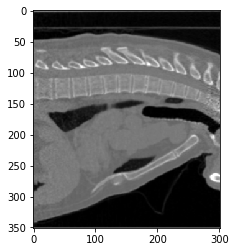

No:1 1.3.6.1.4.1.14519.5.2.1.6279.6001.125356649712550043958727288500 saved


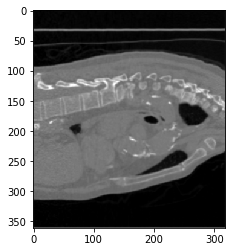

No:2 1.3.6.1.4.1.14519.5.2.1.6279.6001.114218724025049818743426522343 saved


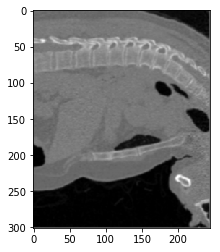

No:3 1.3.6.1.4.1.14519.5.2.1.6279.6001.111017101339429664883879536171 saved


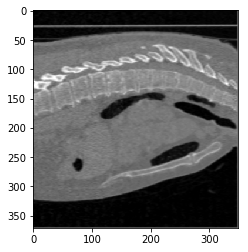

No:4 1.3.6.1.4.1.14519.5.2.1.6279.6001.139713436241461669335487719526 saved


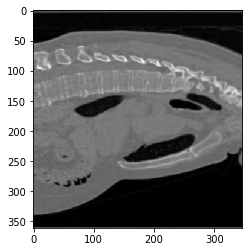

No:5 1.3.6.1.4.1.14519.5.2.1.6279.6001.118140393257625250121502185026 saved


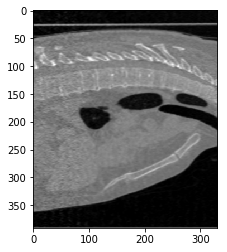

No:6 1.3.6.1.4.1.14519.5.2.1.6279.6001.120196332569034738680965284519 saved


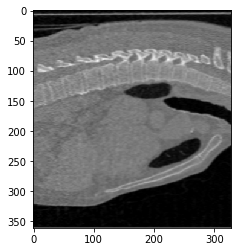

No:7 1.3.6.1.4.1.14519.5.2.1.6279.6001.138674679709964033277400089532 saved


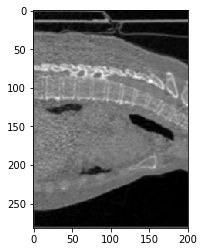

No:8 1.3.6.1.4.1.14519.5.2.1.6279.6001.109002525524522225658609808059 saved


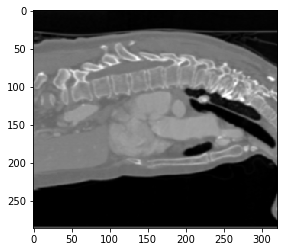

No:9 1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016233746780170740405 saved


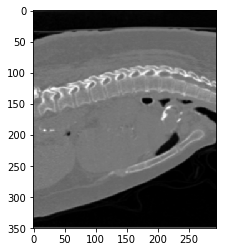

No:10 1.3.6.1.4.1.14519.5.2.1.6279.6001.138080888843357047811238713686 saved


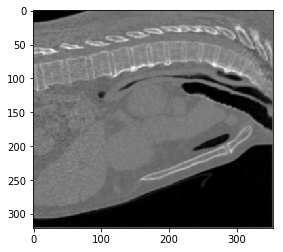

No:11 1.3.6.1.4.1.14519.5.2.1.6279.6001.121824995088859376862458155637 saved


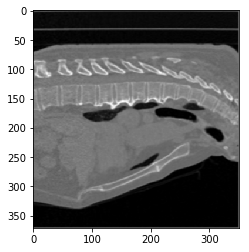

No:12 1.3.6.1.4.1.14519.5.2.1.6279.6001.124154461048929153767743874565 saved


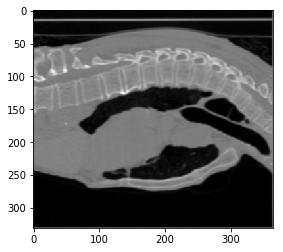

No:13 1.3.6.1.4.1.14519.5.2.1.6279.6001.159996104466052855396410079250 saved


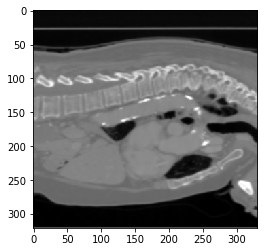

No:14 1.3.6.1.4.1.14519.5.2.1.6279.6001.132817748896065918417924920957 saved


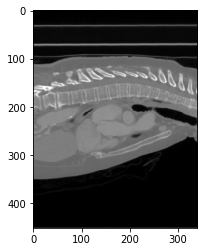

No:15 1.3.6.1.4.1.14519.5.2.1.6279.6001.104780906131535625872840889059 saved


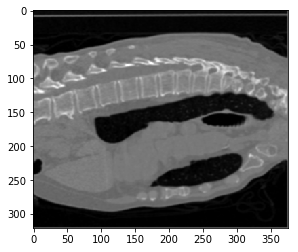

No:16 1.3.6.1.4.1.14519.5.2.1.6279.6001.119515474430718803379832249911 saved


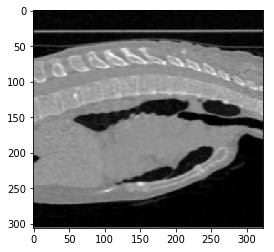

No:17 1.3.6.1.4.1.14519.5.2.1.6279.6001.160124400349792614505500125883 saved


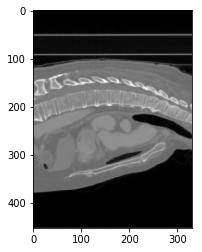

No:18 1.3.6.1.4.1.14519.5.2.1.6279.6001.129982010889624423230394257528 saved


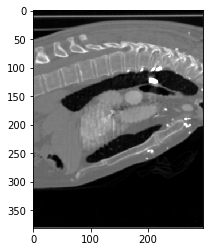

No:19 1.3.6.1.4.1.14519.5.2.1.6279.6001.122621219961396951727742490470 saved


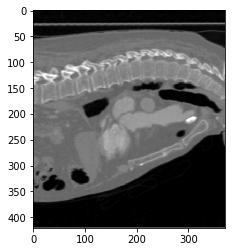

No:20 1.3.6.1.4.1.14519.5.2.1.6279.6001.138813197521718693188313387015 saved


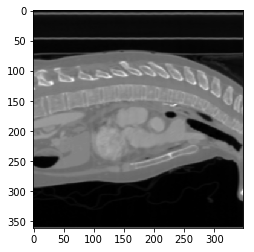

No:21 1.3.6.1.4.1.14519.5.2.1.6279.6001.128059192202504367870633619224 saved


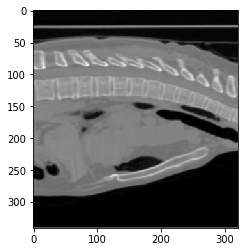

No:22 1.3.6.1.4.1.14519.5.2.1.6279.6001.149463915556499304732434215056 saved


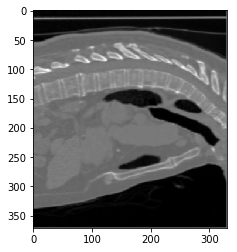

No:23 1.3.6.1.4.1.14519.5.2.1.6279.6001.153646219551578201092527860224 saved


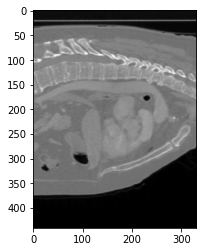

No:24 1.3.6.1.4.1.14519.5.2.1.6279.6001.124663713663969377020085460568 saved


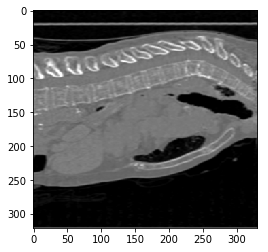

No:25 1.3.6.1.4.1.14519.5.2.1.6279.6001.160586340600816116143631200450 saved


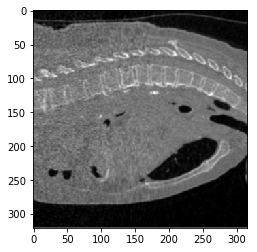

No:26 1.3.6.1.4.1.14519.5.2.1.6279.6001.111258527162678142285870245028 saved


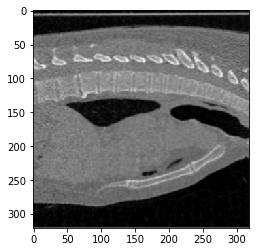

No:27 1.3.6.1.4.1.14519.5.2.1.6279.6001.114195693932194925962391697338 saved


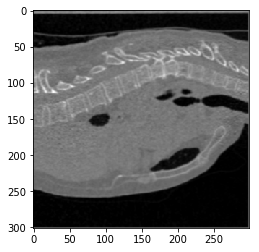

No:28 1.3.6.1.4.1.14519.5.2.1.6279.6001.147325126373007278009743173696 saved


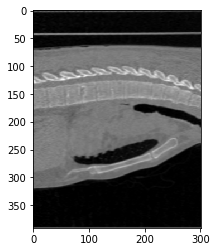

No:29 1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260 saved


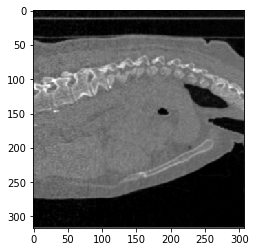

No:30 1.3.6.1.4.1.14519.5.2.1.6279.6001.111496024928645603833332252962 saved


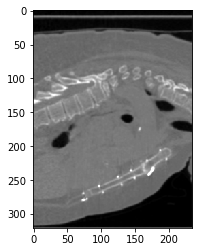

No:31 1.3.6.1.4.1.14519.5.2.1.6279.6001.149893110752986700464921264055 saved


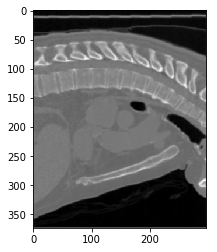

No:32 1.3.6.1.4.1.14519.5.2.1.6279.6001.108231420525711026834210228428 saved


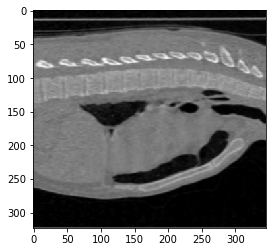

No:33 1.3.6.1.4.1.14519.5.2.1.6279.6001.116492508532884962903000261147 saved


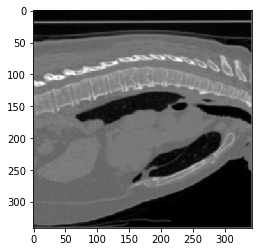

No:34 1.3.6.1.4.1.14519.5.2.1.6279.6001.115386642382564804180764325545 saved


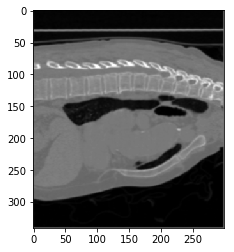

No:35 1.3.6.1.4.1.14519.5.2.1.6279.6001.148935306123327835217659769212 saved


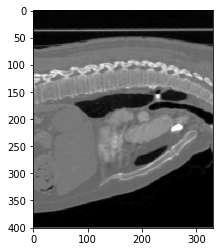

No:36 1.3.6.1.4.1.14519.5.2.1.6279.6001.143410010885830403003179808334 saved


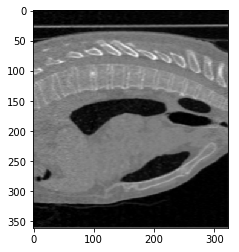

No:37 1.3.6.1.4.1.14519.5.2.1.6279.6001.125067060506283419853742462394 saved


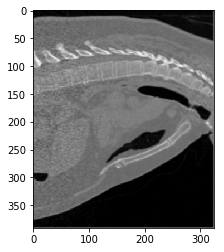

No:38 1.3.6.1.4.1.14519.5.2.1.6279.6001.150684298696437181894923266019 saved


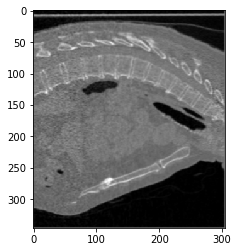

No:39 1.3.6.1.4.1.14519.5.2.1.6279.6001.154837327827713479309898027966 saved


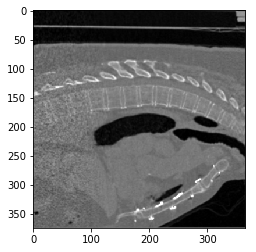

No:40 1.3.6.1.4.1.14519.5.2.1.6279.6001.146429221666426688999739595820 saved


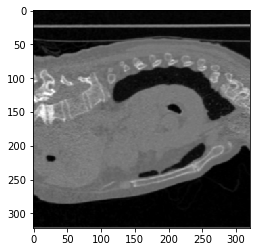

No:41 1.3.6.1.4.1.14519.5.2.1.6279.6001.141345499716190654505508410197 saved


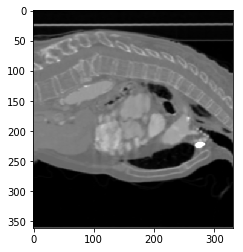

No:42 1.3.6.1.4.1.14519.5.2.1.6279.6001.128023902651233986592378348912 saved


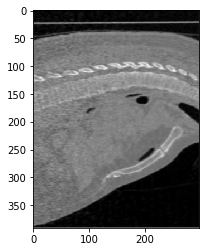

No:43 1.3.6.1.4.1.14519.5.2.1.6279.6001.121805476976020513950614465787 saved


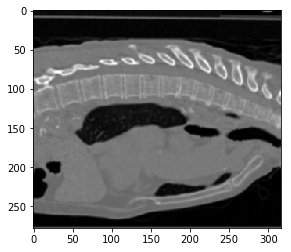

No:44 1.3.6.1.4.1.14519.5.2.1.6279.6001.110678335949765929063942738609 saved


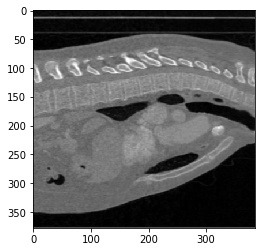

No:45 1.3.6.1.4.1.14519.5.2.1.6279.6001.143622857676008763729469324839 saved


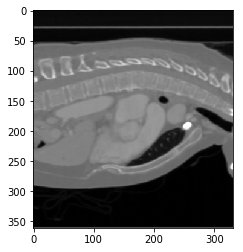

No:46 1.3.6.1.4.1.14519.5.2.1.6279.6001.100953483028192176989979435275 saved


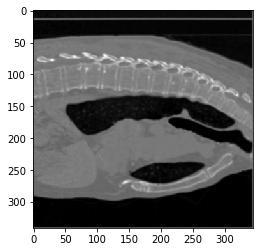

No:47 1.3.6.1.4.1.14519.5.2.1.6279.6001.130036599816889919308975074972 saved


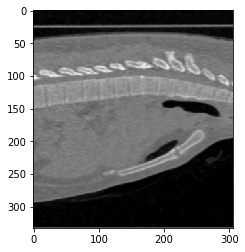

No:48 1.3.6.1.4.1.14519.5.2.1.6279.6001.159665703190517688573100822213 saved


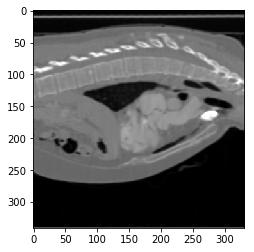

No:49 1.3.6.1.4.1.14519.5.2.1.6279.6001.129007566048223160327836686225 saved


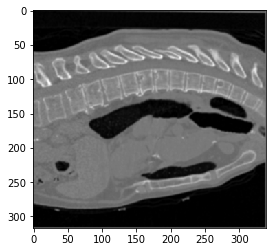

No:50 1.3.6.1.4.1.14519.5.2.1.6279.6001.129055977637338639741695800950 saved


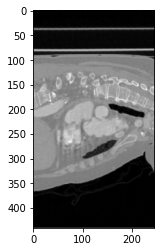

No:51 1.3.6.1.4.1.14519.5.2.1.6279.6001.134996872583497382954024478441 saved


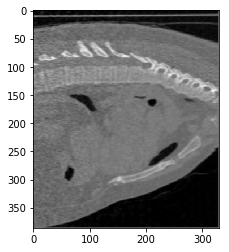

No:52 1.3.6.1.4.1.14519.5.2.1.6279.6001.106419850406056634877579573537 saved


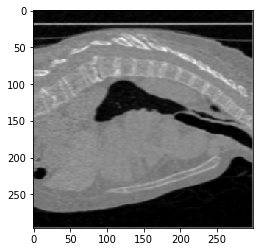

No:53 1.3.6.1.4.1.14519.5.2.1.6279.6001.130765375502800983459674173881 saved


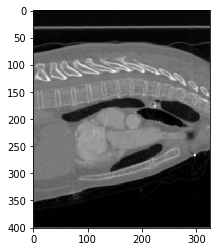

No:54 1.3.6.1.4.1.14519.5.2.1.6279.6001.134519406153127654901640638633 saved


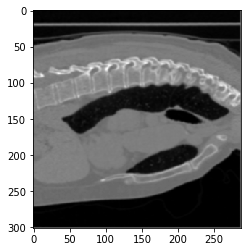

No:55 1.3.6.1.4.1.14519.5.2.1.6279.6001.114914167428485563471327801935 saved


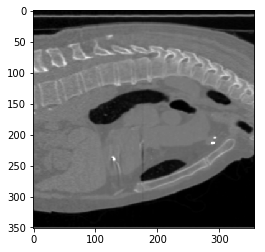

No:56 1.3.6.1.4.1.14519.5.2.1.6279.6001.152684536713461901635595118048 saved


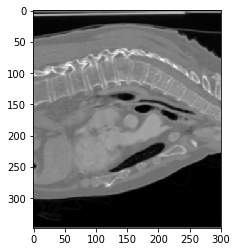

No:57 1.3.6.1.4.1.14519.5.2.1.6279.6001.151764021165118974848436095034 saved


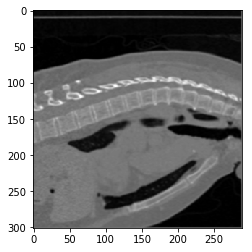

No:58 1.3.6.1.4.1.14519.5.2.1.6279.6001.135657246677982059395844827629 saved


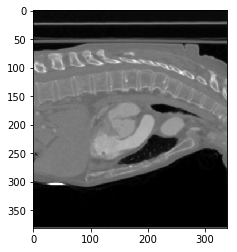

No:59 1.3.6.1.4.1.14519.5.2.1.6279.6001.126631670596873065041988320084 saved


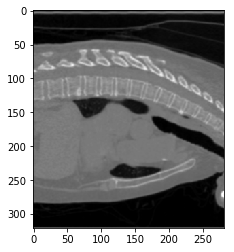

No:60 1.3.6.1.4.1.14519.5.2.1.6279.6001.143412474064515942785157561636 saved


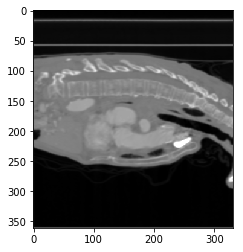

No:61 1.3.6.1.4.1.14519.5.2.1.6279.6001.120842785645314664964010792308 saved


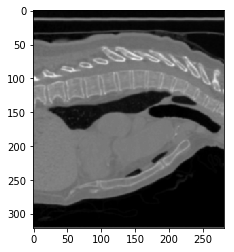

No:62 1.3.6.1.4.1.14519.5.2.1.6279.6001.156579001330474859527530187095 saved


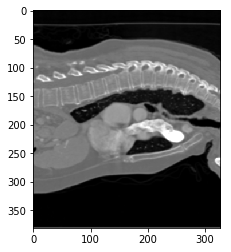

No:63 1.3.6.1.4.1.14519.5.2.1.6279.6001.106719103982792863757268101375 saved


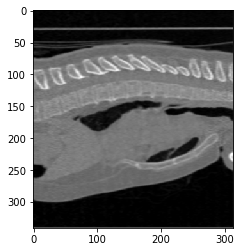

No:64 1.3.6.1.4.1.14519.5.2.1.6279.6001.100620385482151095585000946543 saved


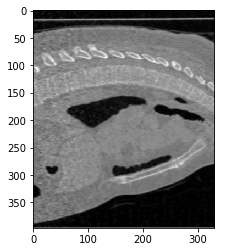

No:65 1.3.6.1.4.1.14519.5.2.1.6279.6001.152706273988004688708784163325 saved


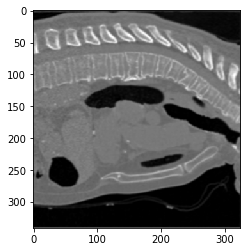

No:66 1.3.6.1.4.1.14519.5.2.1.6279.6001.137375498893536422914241295628 saved


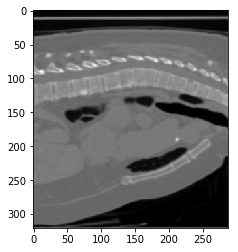

No:67 1.3.6.1.4.1.14519.5.2.1.6279.6001.145759169833745025756371695397 saved


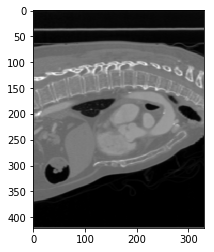

No:68 1.3.6.1.4.1.14519.5.2.1.6279.6001.161002239822118346732951898613 saved


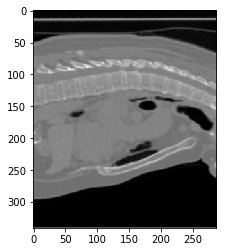

No:69 1.3.6.1.4.1.14519.5.2.1.6279.6001.145283812746259413053188838096 saved


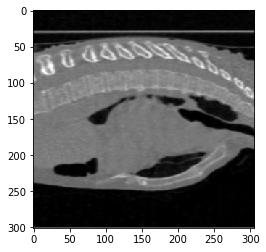

No:70 1.3.6.1.4.1.14519.5.2.1.6279.6001.145474881373882284343459153872 saved


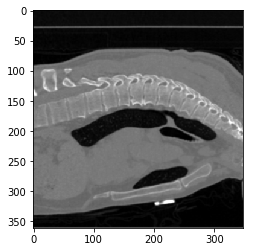

No:71 1.3.6.1.4.1.14519.5.2.1.6279.6001.111780708132595903430640048766 saved


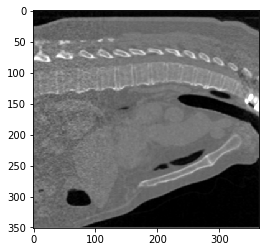

No:72 1.3.6.1.4.1.14519.5.2.1.6279.6001.129650136453746261130135157590 saved


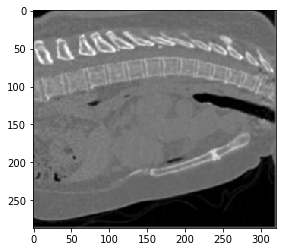

No:73 1.3.6.1.4.1.14519.5.2.1.6279.6001.139444426690868429919252698606 saved


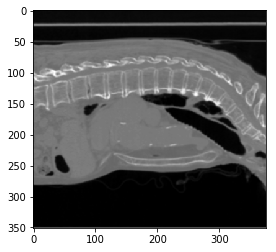

No:74 1.3.6.1.4.1.14519.5.2.1.6279.6001.154703816225841204080664115280 saved


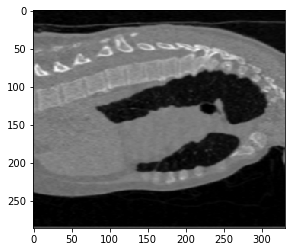

No:75 1.3.6.1.4.1.14519.5.2.1.6279.6001.126121460017257137098781143514 saved


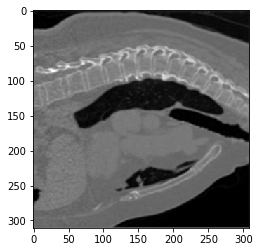

No:76 1.3.6.1.4.1.14519.5.2.1.6279.6001.139595277234735528205899724196 saved


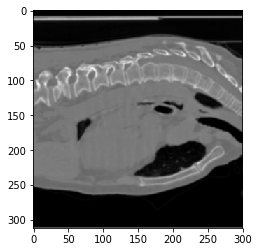

No:77 1.3.6.1.4.1.14519.5.2.1.6279.6001.119304665257760307862874140576 saved


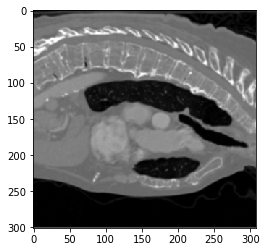

No:78 1.3.6.1.4.1.14519.5.2.1.6279.6001.140239815496047437552471323962 saved


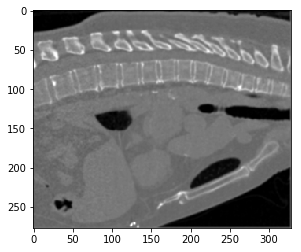

No:79 1.3.6.1.4.1.14519.5.2.1.6279.6001.109882169963817627559804568094 saved


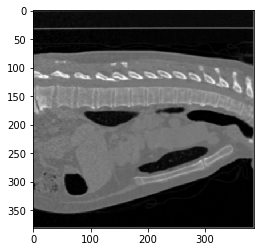

No:80 1.3.6.1.4.1.14519.5.2.1.6279.6001.141430002307216644912805017227 saved


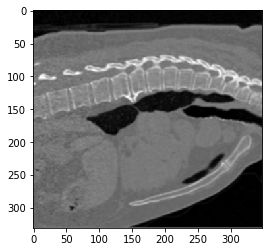

No:81 1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222365663678666836860 saved


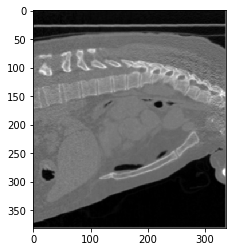

No:82 1.3.6.1.4.1.14519.5.2.1.6279.6001.111172165674661221381920536987 saved


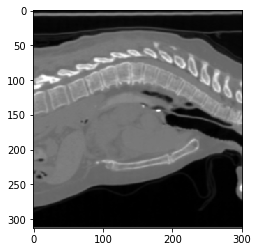

No:83 1.3.6.1.4.1.14519.5.2.1.6279.6001.113679818447732724990336702075 saved


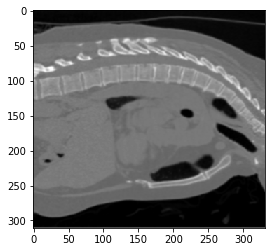

No:84 1.3.6.1.4.1.14519.5.2.1.6279.6001.141511313712034597336182402384 saved


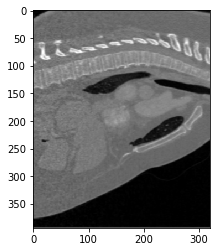

No:85 1.3.6.1.4.1.14519.5.2.1.6279.6001.143782059748737055784173697516 saved


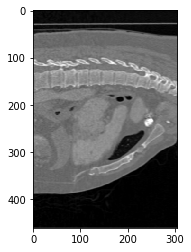

No:86 1.3.6.1.4.1.14519.5.2.1.6279.6001.124656777236468248920498636247 saved


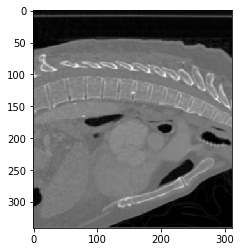

No:87 1.3.6.1.4.1.14519.5.2.1.6279.6001.142485715518010940961688015191 saved


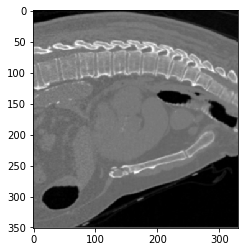

No:88 1.3.6.1.4.1.14519.5.2.1.6279.6001.139577698050713461261415990027 saved


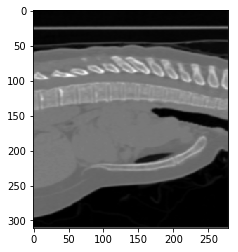

No:89 1.3.6.1.4.1.14519.5.2.1.6279.6001.133132722052053001903031735878 saved


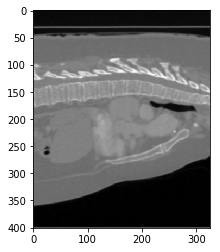

No:90 1.3.6.1.4.1.14519.5.2.1.6279.6001.128881800399702510818644205032 saved


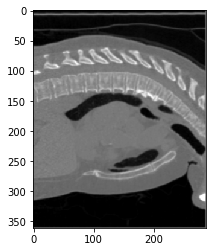

No:91 1.3.6.1.4.1.14519.5.2.1.6279.6001.116097642684124305074876564522 saved


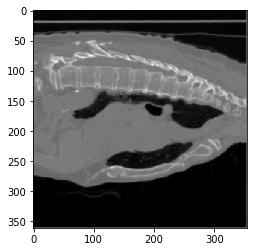

No:92 1.3.6.1.4.1.14519.5.2.1.6279.6001.145510611155363050427743946446 saved


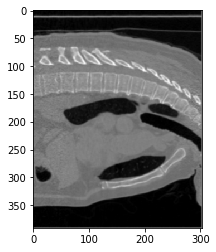

No:93 1.3.6.1.4.1.14519.5.2.1.6279.6001.139889514693390832525232698200 saved


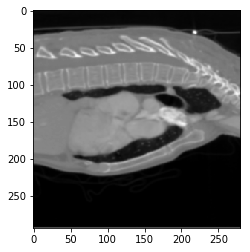

No:94 1.3.6.1.4.1.14519.5.2.1.6279.6001.141069661700670042960678408762 saved


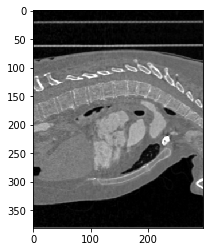

No:95 1.3.6.1.4.1.14519.5.2.1.6279.6001.133378195429627807109985347209 saved


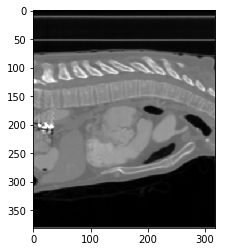

No:96 1.3.6.1.4.1.14519.5.2.1.6279.6001.140253591510022414496468423138 saved


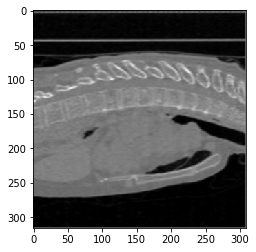

No:97 1.3.6.1.4.1.14519.5.2.1.6279.6001.122763913896761494371822656720 saved


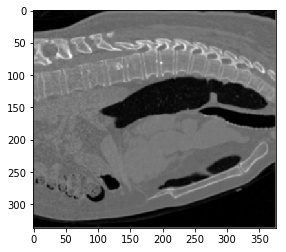

No:98 1.3.6.1.4.1.14519.5.2.1.6279.6001.124822907934319930841506266464 saved


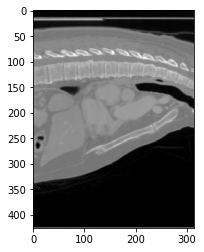

No:99 1.3.6.1.4.1.14519.5.2.1.6279.6001.117040183261056772902616195387 saved


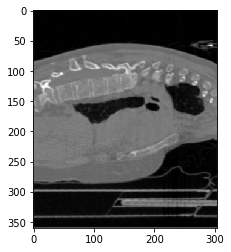

No:100 1.3.6.1.4.1.14519.5.2.1.6279.6001.123697637451437522065941162930 saved


In [65]:
# # COMMENTED OUT TO PREVENT ACCIDENTS ;)
# import os
# import nibabel as nib
# from nibabel import processing
# from medpy.filter.smoothing import anisotropic_diffusion, gauss_xminus1d
# import random

# base_dir = '../../datasets/lidc_idri_nifti'
# spine_scans_base_dir = '../spine_scans_numpy'

# scan_dirs = os.listdir(base_dir)
# scan_dirs = [ os.path.join(base_dir, p) for p in scan_dirs if os.path.isfile(os.path.join(base_dir, p)) ]

# # randomly shuffles input
# random.shuffle(scan_dirs)

# mask_dir = os.path.join(base_dir, 'results')
# count = 0


# # stats mean -513.3752203244509 max:1200.0 min:-1000.0 - should be calculated for train and test set!
# global_mean = -513.3752203244509
# global_max = 1200
# global_min = -1000

# def get_scan_name(path):
#     return path.split('/')[-1].replace('.nii.gz','')


# for scan_dir in scan_dirs:
#     scan_name = get_scan_name(scan_dir)
#     # only select scans with corresponding masks in nifti format
#     mask_name = '{}_seg.nii.gz'.format(scan_name)
    
#     if os.path.isfile(os.path.join(mask_dir, mask_name)) == True and count < 100:
#         scan = nib.load(scan_dir)
#         mask = nib.load(os.path.join(mask_dir, mask_name))
        
#         # save slope and intercept for HU normalisation
#         slope = scan.dataobj.slope
#         intercept = scan.dataobj.inter
        
#         # resample to 1mm isotropic
#         scan = processing.resample_to_output(scan, (1,1,1))
#         mask = processing.resample_to_output(mask, (1,1,1))
        
#         # get numpy representation
#         scan_numpy = scan.get_fdata()
#         mask_numpy = mask.get_fdata()
                
#         x, y, z = scan_numpy.shape
        
#         # smooth out the noise
#         scan_numpy = gauss_xminus1d(scan_numpy, sigma=0.9, dim=0)
        
#         # convert to HU
#         scan_numpy = normalise_HU(scan_numpy, slope, intercept)        
        
#         # thresholding for contrast adjustment
#         scan_numpy[scan_numpy < -1000] = -1000
#         scan_numpy[scan_numpy > 1200] = 1200
        
#         show_image(scan_numpy[x//2])
        
#         assert(scan_numpy.shape == mask_numpy.shape)
        
#         save_path = os.path.join(spine_scans_base_dir, '{}.{}'.format(scan_name, i))
        
#         # save denoised and HU scaled CT scans!
#         np.savez(save_path, image=scan_numpy, mask=mask_numpy)

#         count += 1
#         print('No:{} {} saved'.format(count, scan_name))

In [59]:
print(save_base)

../mr_sag_kr


### MRI (T1) stage 1

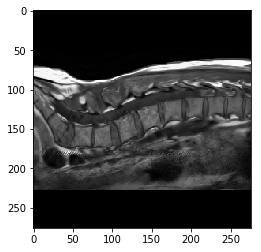

1 False DIXCTWS073


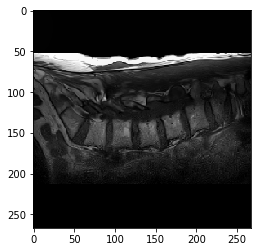

2 False DIXCTWS034


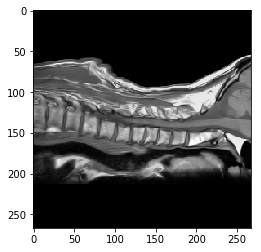

3 False DIXCTWS015


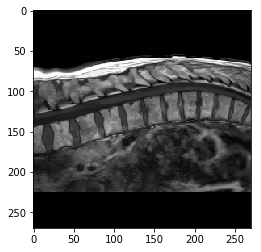

4 True DIXCTWS149


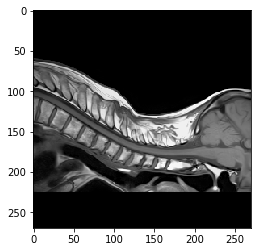

5 True DIXCTWS149


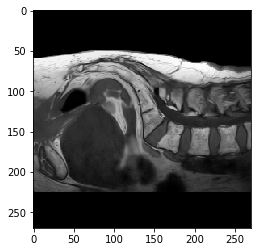

6 True DIXCTWS149


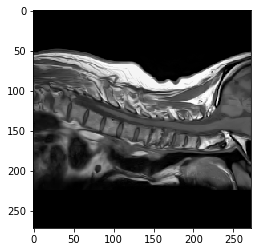

7 False DIXCTWS011


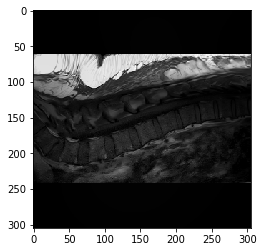

8 False DIXCTWS107


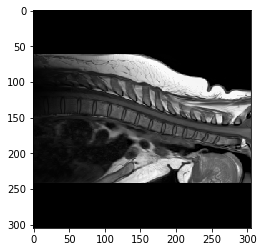

9 False DIXCTWS107


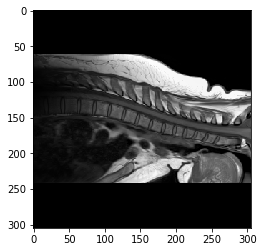

10 False DIXCTWS107


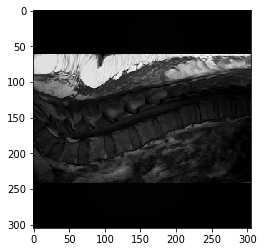

11 False DIXCTWS107


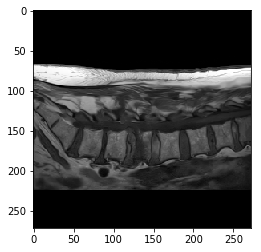

12 False DIXCTWS082


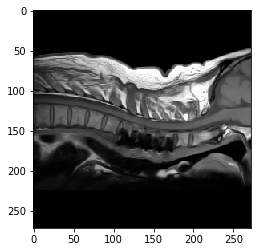

13 False DIXCTWS067


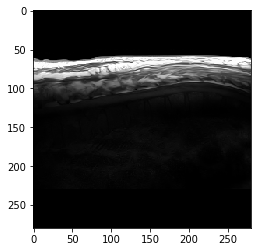

14 False DIXCTWS044


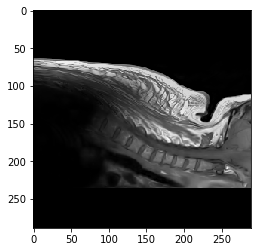

15 False DIXCTWS044


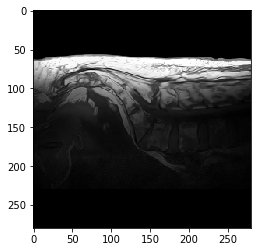

16 False DIXCTWS044


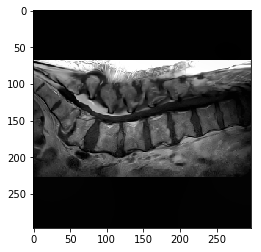

17 False DIXCTWS042


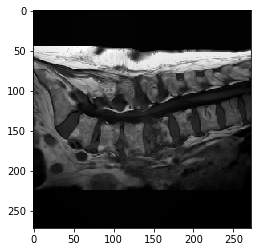

18 False DIXCTWS085


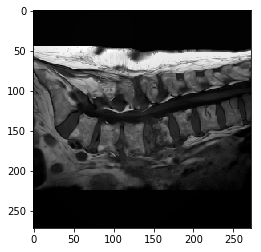

19 False DIXCTWS085


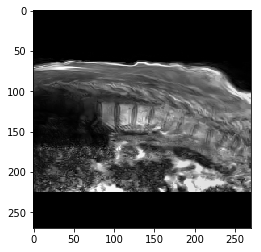

20 True DIXCTWS105


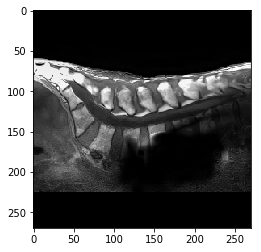

21 True DIXCTWS105


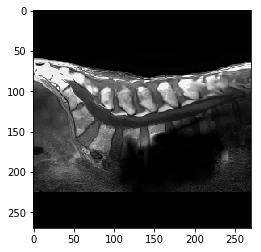

22 True DIXCTWS105


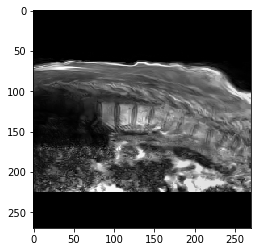

23 True DIXCTWS105


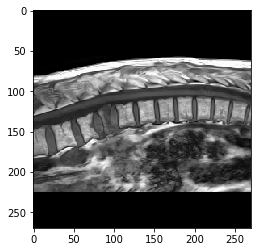

24 False DIXCTWS019


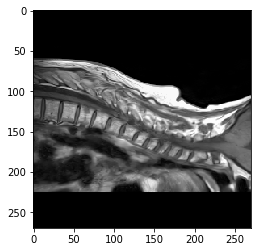

25 False DIXCTWS019


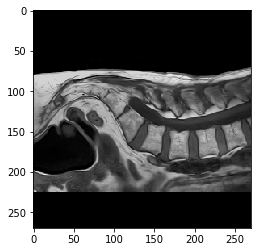

26 False DIXCTWS019


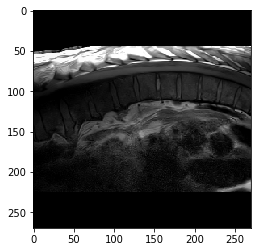

27 False DIXCTWS156


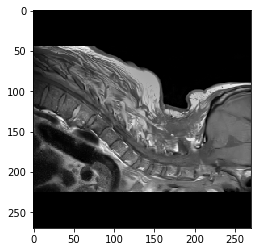

28 False DIXCTWS156


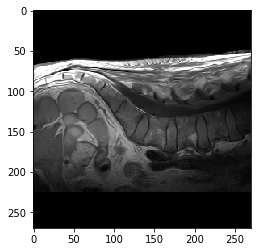

29 False DIXCTWS156


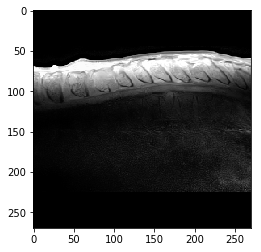

30 True DIXCTWS108


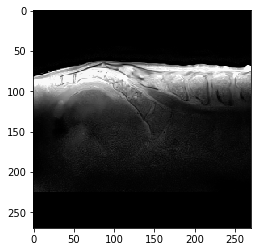

31 True DIXCTWS108


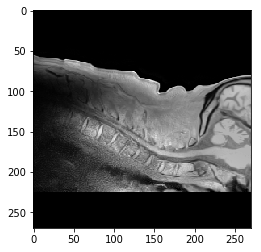

32 True DIXCTWS108


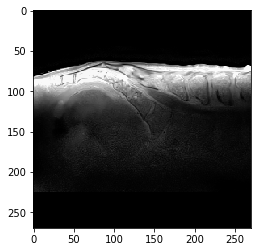

33 True DIXCTWS108


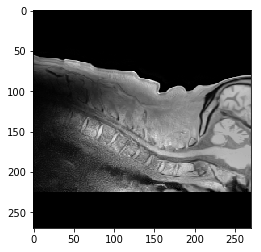

34 True DIXCTWS108


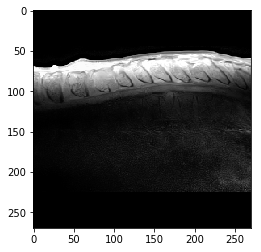

35 True DIXCTWS108


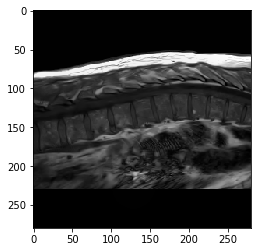

36 True DIXCTWS021


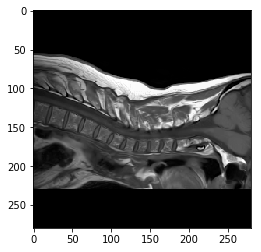

37 True DIXCTWS021


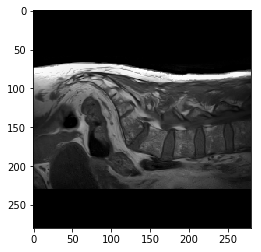

38 True DIXCTWS021


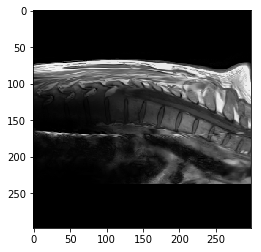

39 False DIXCTWS027


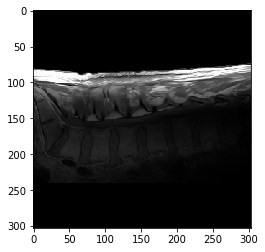

40 False DIXCTWS027


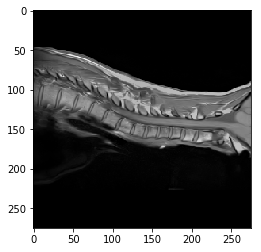

41 False DIXCTWS096


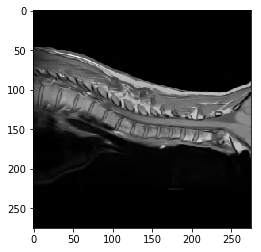

42 False DIXCTWS096


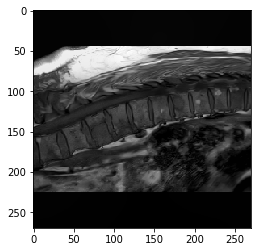

43 False DIXCTWS158


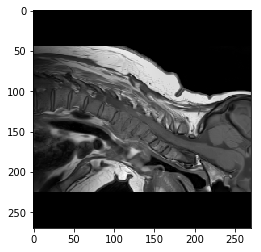

44 False DIXCTWS158


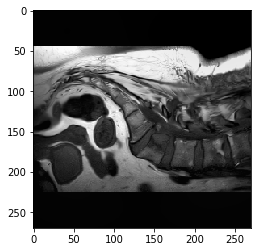

45 False DIXCTWS158


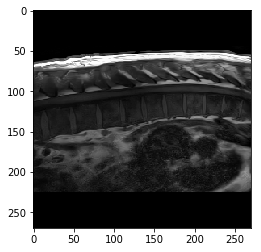

46 True DIXCTWS152


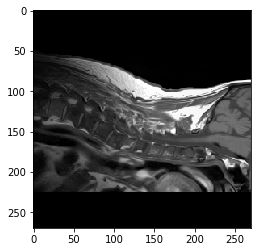

47 True DIXCTWS152


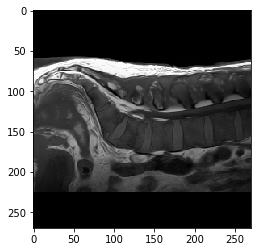

48 True DIXCTWS152


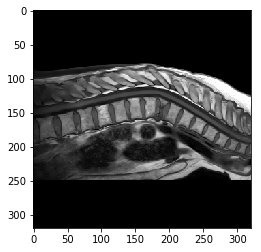

49 False DIXCTWS101


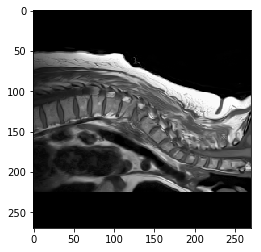

50 False DIXCTWS088


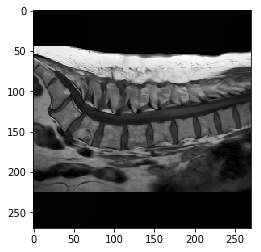

51 False DIXCTWS088


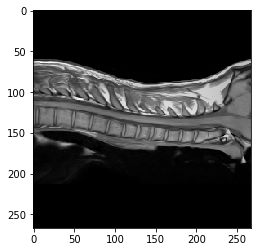

52 False DIXCTWS035


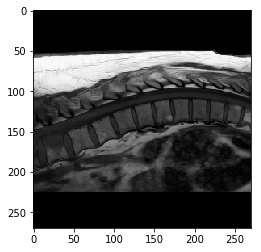

53 False DIXCTWS141


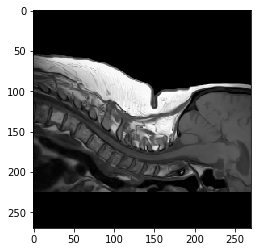

54 False DIXCTWS141


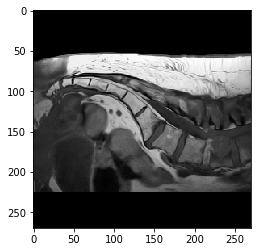

55 False DIXCTWS141


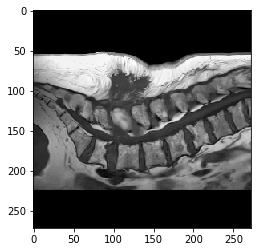

56 False DIXCTWS078


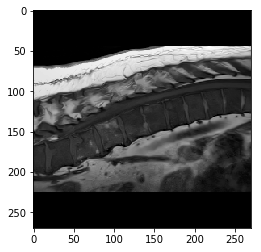

57 True DIXCTWS150


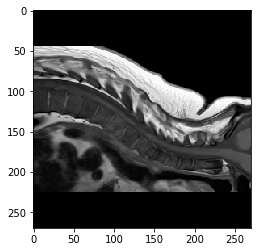

58 True DIXCTWS150


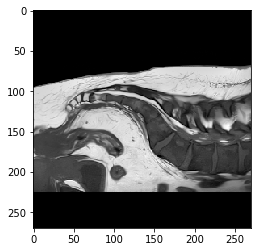

59 True DIXCTWS150


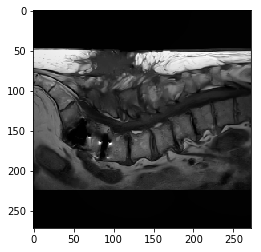

60 False DIXCTWS074


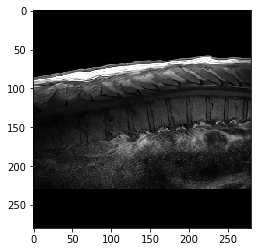

61 False DIXCTWS018


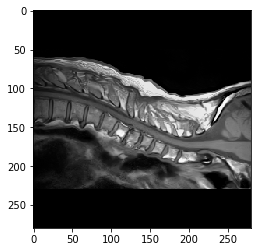

62 False DIXCTWS018


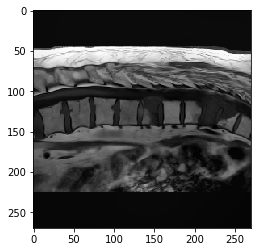

63 False DIXCTWS144


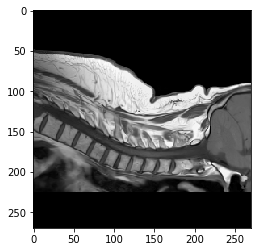

64 False DIXCTWS144


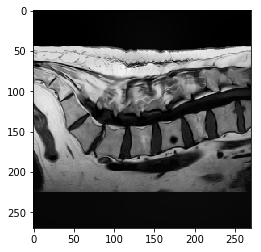

65 True DIXCTWS144


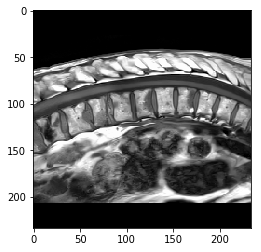

66 False DIXCTWS159


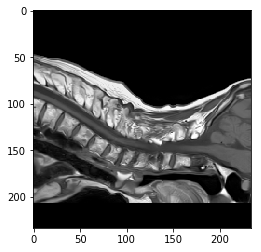

67 False DIXCTWS159


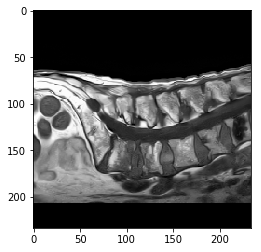

68 False DIXCTWS159


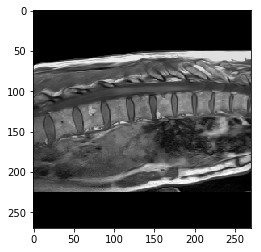

69 False DIXCTWS069


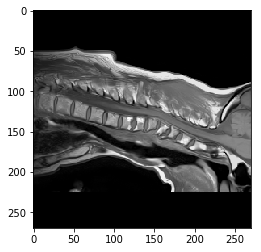

70 False DIXCTWS069


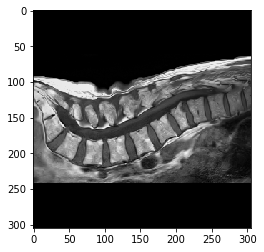

71 False DIXCTWS104


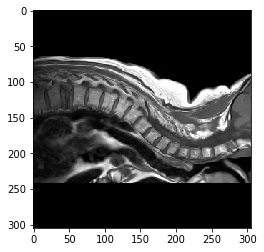

72 False DIXCTWS104


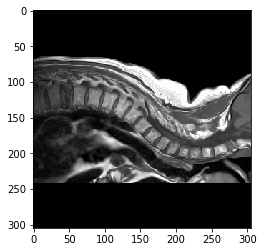

73 False DIXCTWS104


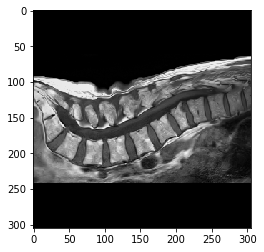

74 False DIXCTWS104


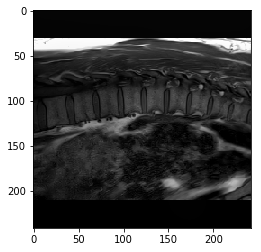

75 False DIXCTWS084


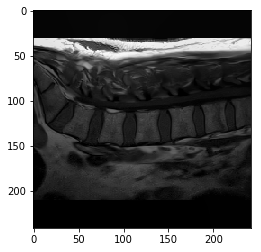

76 False DIXCTWS084


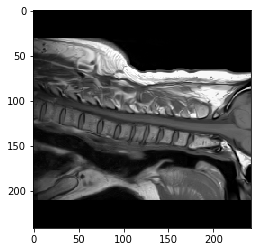

77 False DIXCTWS084


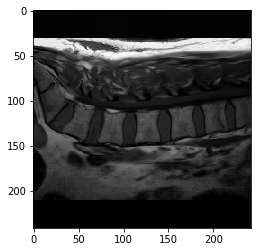

78 False DIXCTWS084


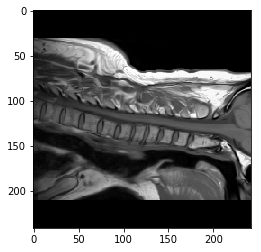

79 False DIXCTWS084


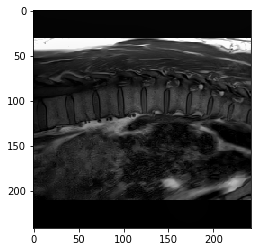

80 False DIXCTWS084


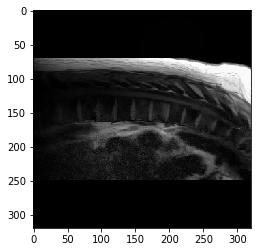

81 False DIXCTWS033


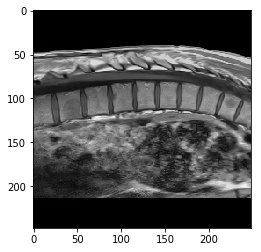

82 False DIXCTWS071


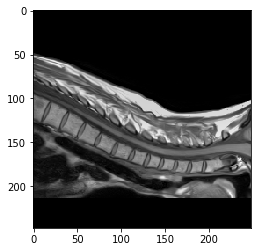

83 False DIXCTWS071


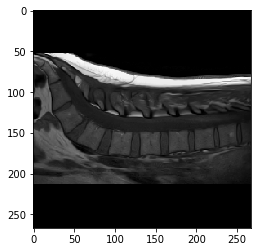

84 False DIXCTWS020


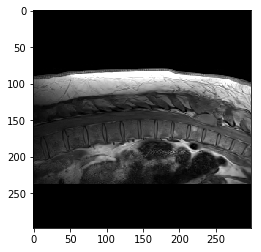

85 False DIXCTWS017


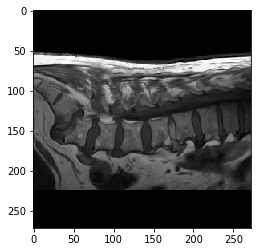

86 False DIXCTWS072


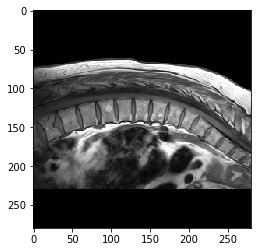

87 False DIXCTWS026


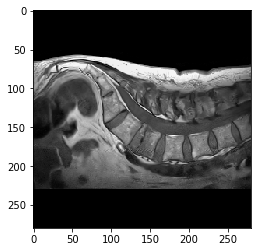

88 False DIXCTWS026


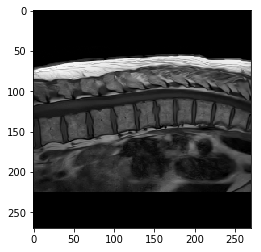

89 True DIXCTWS146


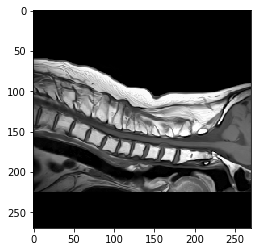

90 True DIXCTWS146


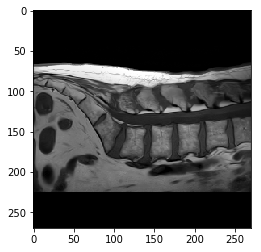

91 True DIXCTWS146


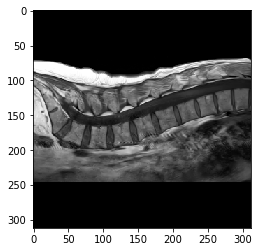

92 False DIXCTWS016


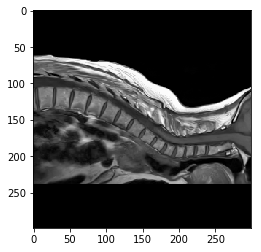

93 False DIXCTWS016


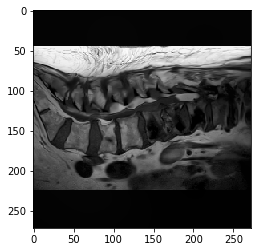

94 False DIXCTWS081


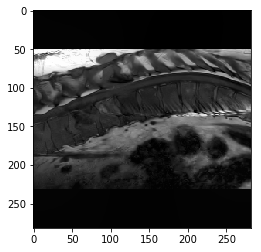

95 False DIXCTWS002


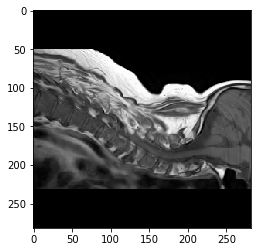

96 False DIXCTWS002


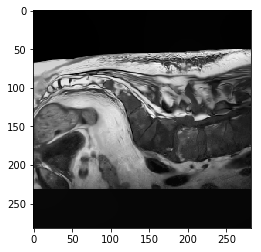

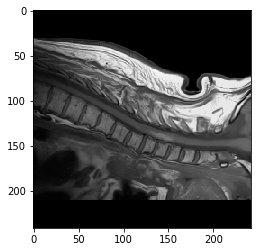

102 False DIXCTWS145


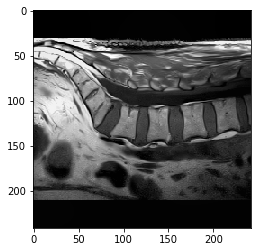

103 False DIXCTWS145


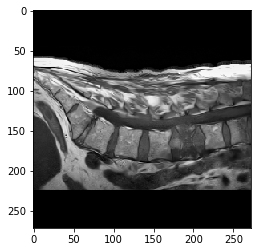

104 False DIXCTWS079


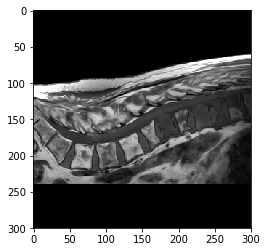

105 False DIXCTWS109


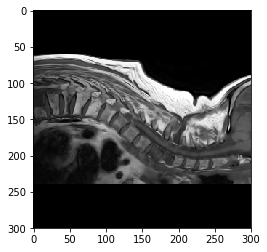

106 False DIXCTWS109


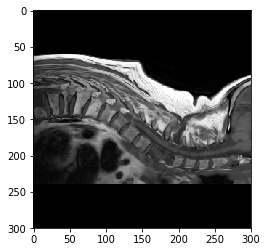

107 False DIXCTWS109


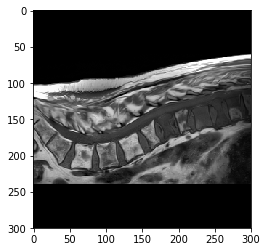

108 False DIXCTWS109


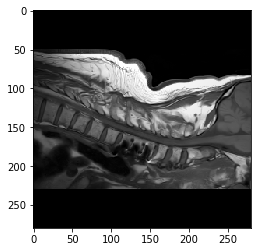

109 False DIXCTWS007


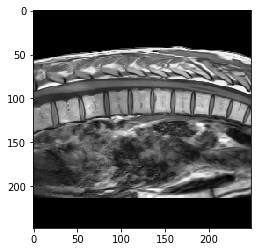

110 False DIXCTWS148


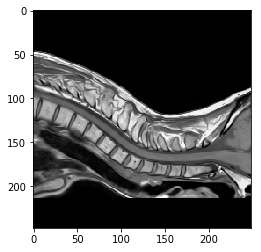

111 False DIXCTWS148


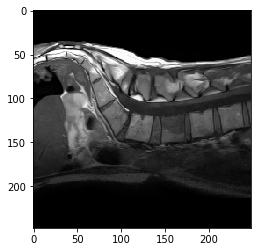

112 False DIXCTWS148


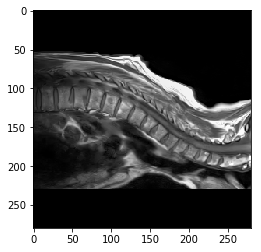

113 False DIXCTWS003


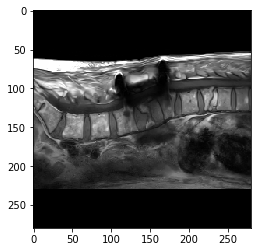

114 False DIXCTWS003


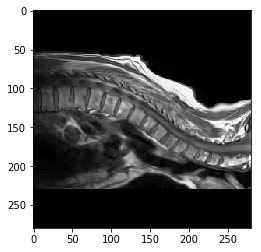

115 False DIXCTWS003


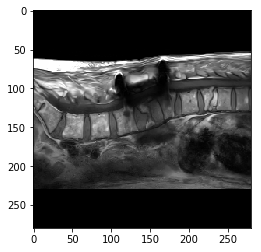

116 False DIXCTWS003


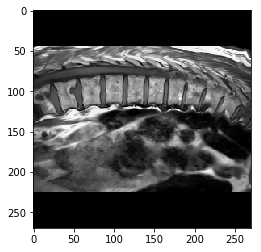

117 False DIXCTWS142


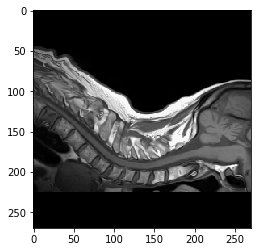

118 False DIXCTWS142


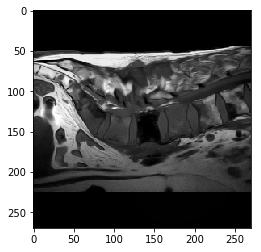

119 False DIXCTWS142


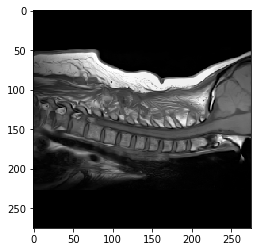

120 False DIXCTWS097


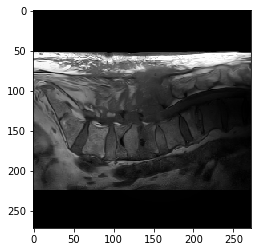

121 False DIXCTWS099


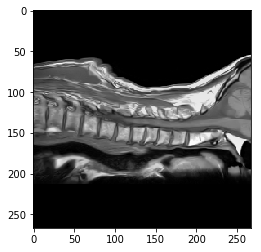

122 False DIXCTWS014


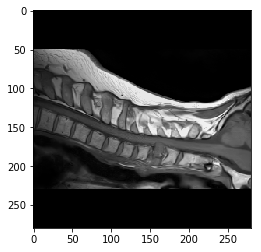

123 False DIXCTWS092


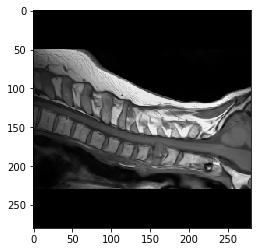

124 False DIXCTWS092


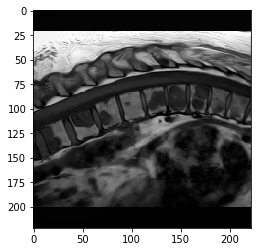

125 False DIXCTWS160


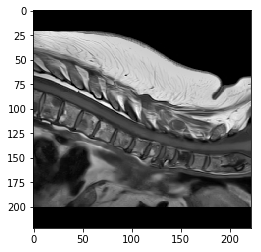

126 False DIXCTWS160


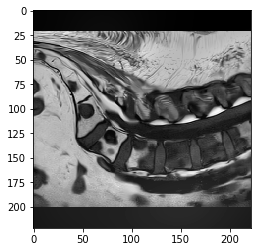

127 False DIXCTWS160


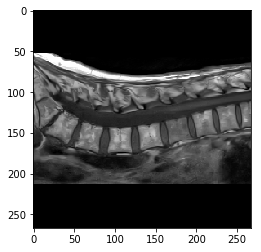

128 False DIXCTWS031


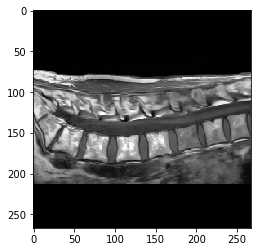

129 False DIXCTWS031


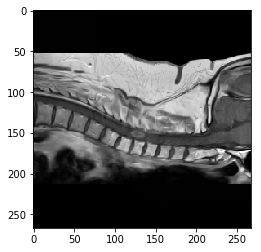

130 False DIXCTWS100


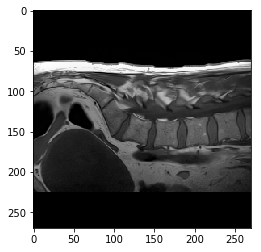

131 False DIXCTWS087


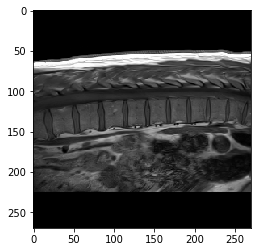

132 False DIXCTWS087


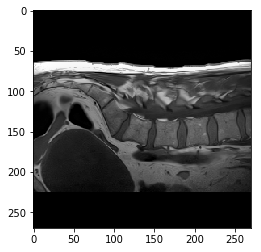

133 False DIXCTWS087


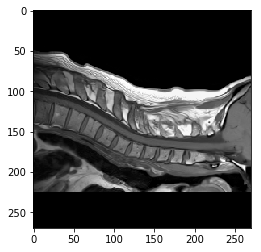

134 False DIXCTWS087


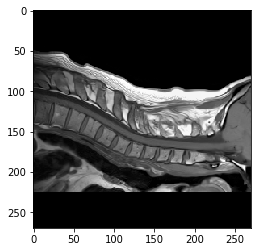

135 False DIXCTWS087


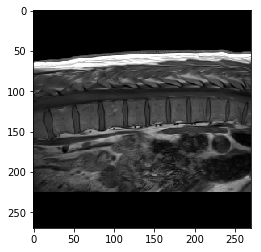

136 False DIXCTWS087


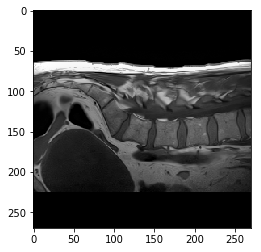

137 False DIXCTWS087


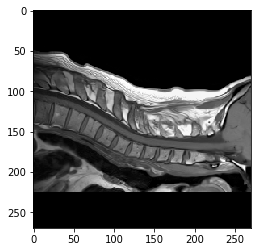

138 False DIXCTWS087


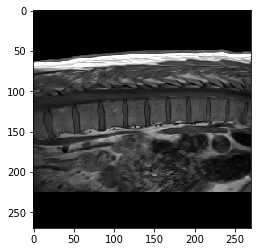

139 False DIXCTWS087


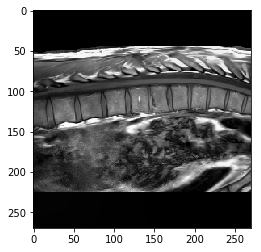

140 False DIXCTWS155


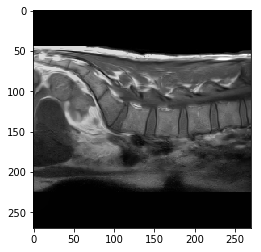

141 False DIXCTWS155


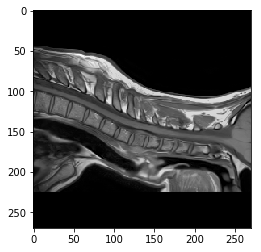

142 False DIXCTWS155


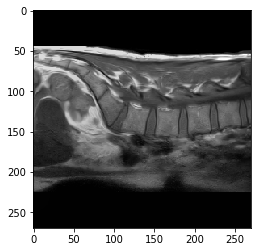

143 False DIXCTWS155


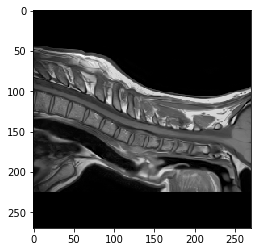

144 False DIXCTWS155


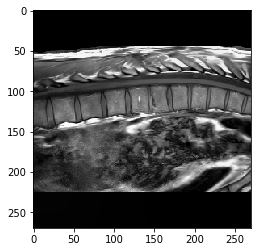

145 False DIXCTWS155


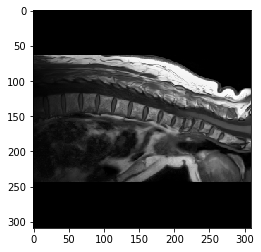

146 False DIXCTWS147


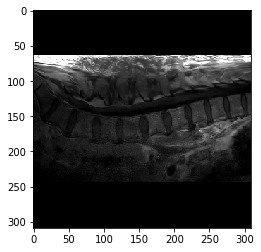

147 False DIXCTWS147


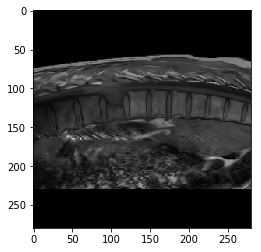

148 True DIXCTWS028


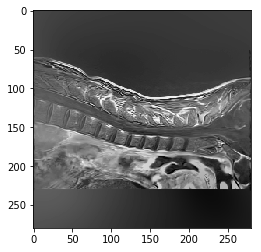

149 True DIXCTWS028


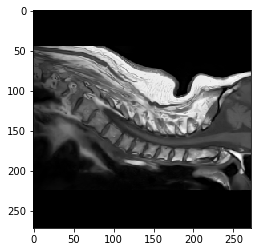

150 False DIXCTWS022


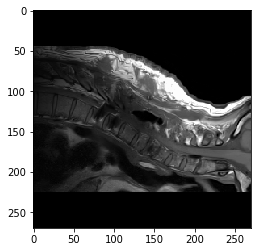

151 False DIXCTWS089


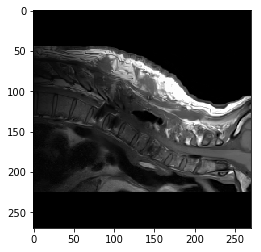

152 False DIXCTWS089


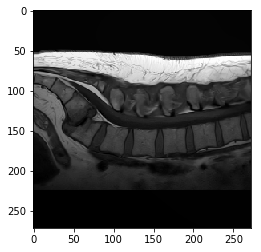

153 False DIXCTWS037


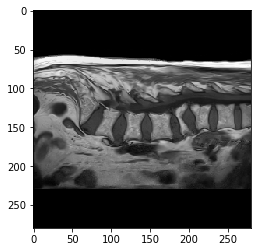

154 False DIXCTWS005


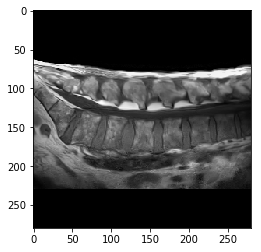

155 False DIXCTWS025


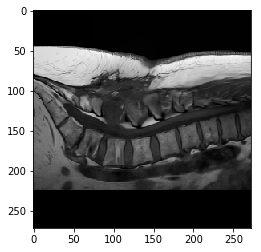

156 False DIXCTWS077


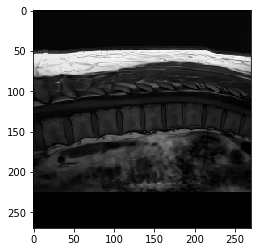

157 False DIXCTWS068


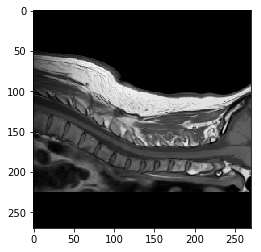

158 False DIXCTWS068


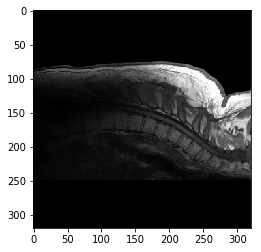

159 False DIXCTWS023


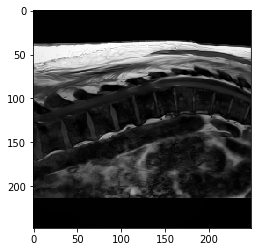

160 False DIXCTWS153


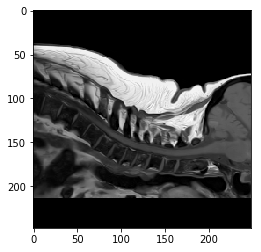

161 False DIXCTWS153


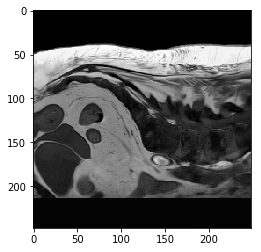

162 False DIXCTWS153


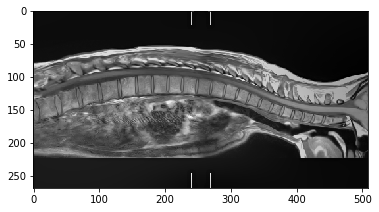

163 False DIXCTWS009


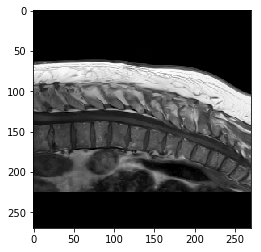

164 False DIXCTWS032


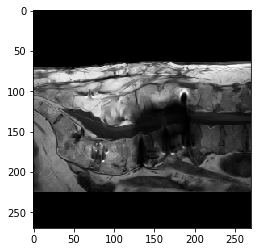

165 False DIXCTWS032


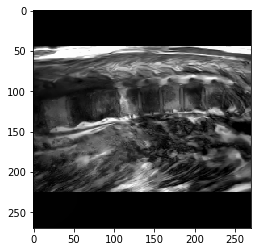

166 True DIXCTWS154


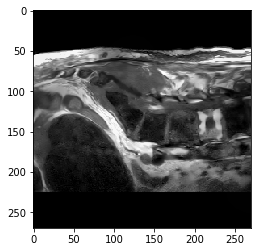

167 True DIXCTWS154


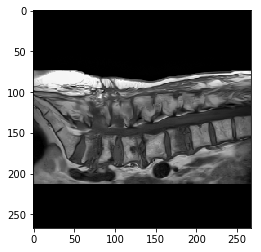

168 False DIXCTWS090


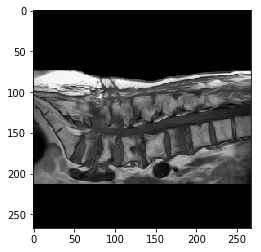

169 False DIXCTWS090


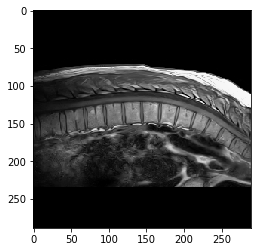

170 False DIXCTWS024


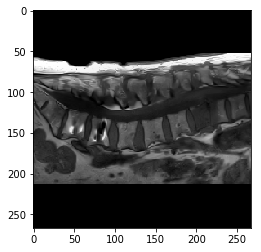

171 False DIXCTWS103


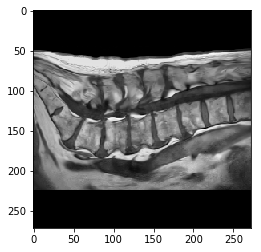

172 False DIXCTWS076


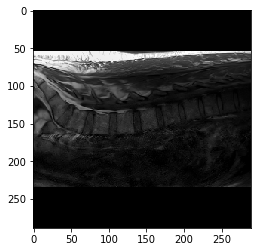

173 False DIXCTWS094


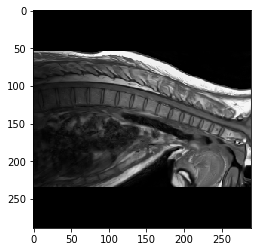

174 False DIXCTWS094


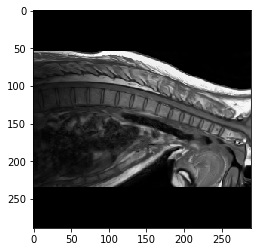

175 False DIXCTWS094


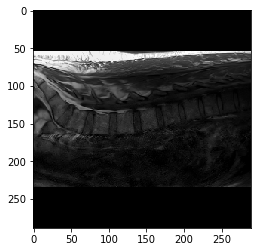

176 False DIXCTWS094


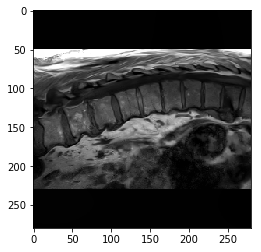

177 False DIXCTWS036


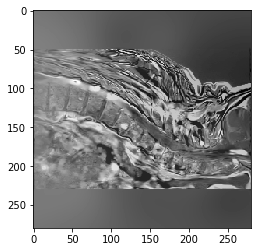

178 False DIXCTWS036


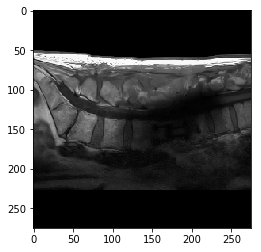

179 False DIXCTWS083


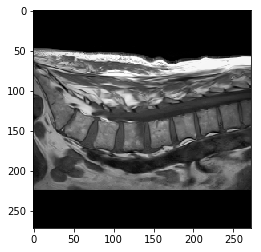

180 False DIXCTWS086


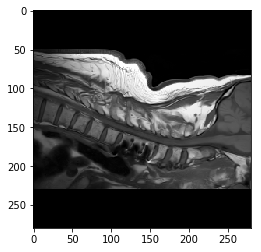

181 False DIXCTWS006


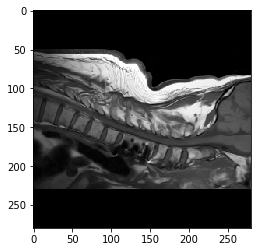

182 False DIXCTWS006


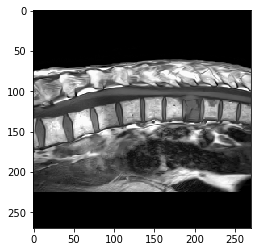

183 False DIXCTWS143


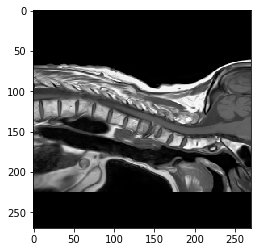

184 False DIXCTWS143


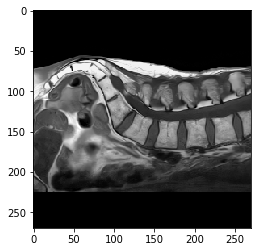

185 False DIXCTWS143


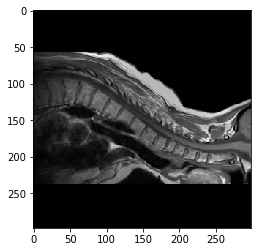

186 False DIXCTWS041


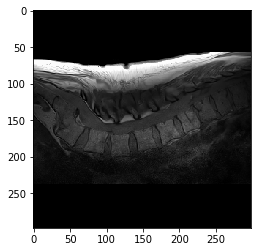

187 False DIXCTWS041
final scans  187


In [68]:
# import os
# import ants
# from util import show_image


# base = '../../../bayata/datasets/MR_CT_forGAN/CT_MR_Nrad'
# save_path = '../spine_scans_numpy_mri'

# # array to track which dims already seen. If dims is the same
# # assume they are identical

# dims = []
# broken = [
#     'DIXCTWS008',
#     '20181123_23231402CCTSpiraleStrokes029a021A_seg.nii.gz'
# ]

# seg_names = [
#     '20181127_192154T2mDixonsag3mms352a1003_seg_resamp.nii.gz',
#     '20190214_153215cs17T2mDixonsag3mms352a1003_seg_resamp.nii.gz',
#     '20190214_153215cs17T2mDixonsag3mms353a1003_seg_resamp.nii.gz',
#     '20181214_133146WIPT2mDixonsag3mms351a1003_seg_resamp.nii.gz',
#     '20190207_224611T2mDixonsag3mms352a1003_seg_resamp.nii.gz',
#     '20190207_224611T2mDixonsag3mms351a1003_seg_resamp.nii.gz',
#     '20181231_184002T2mDixonsag3mms352a1003_seg_resamp.nii.gz',
#     '20190208_115309cs17T2mDixonsag3mms352a1003_seg_resamp.nii.gz',
#     '20181128_183519WIPT2mDixonsag3mms352a1003_seg_resamp.nii.gz',
#     '20181126_135027T2mDixonsag3mms352a1003_seg_resamp.nii.gz',
#     '20181120_194954T2mDixonsag3mms351a1003_seg_resamp.nii.gz',
#     '20181120_194954T2mDixonsag3mms353a1003_seg_resamp.nii.gz',
#     '20181123_161947T2mDixonsag3mms352a1003_seg_resamp.nii.gz',
#     '20190203_121518cs17T2mDixonsag3mms351a1003_seg_resamp.nii.gz',
#     '20190201_222148cs17T2mDixonsag3mms351a1003_seg_resamp.nii.gz',
#     '20181119_134800T2mDixonsag3mms352a1003_seg_resamp',
#     '20181218_133903WIPT2mDixonsag3mms352a1003_seg_resamp.nii.gz',
#     '20190210_213600cs17T2mDixonsag3mms352a1003_seg_resamp.nii.gz',
#     '20181205_093847T2mDixonsag3mms352a1003_seg_resamp.nii.gz',
#     '20190227_194332T2mDixonsag3mmcss251a1002_seg_resamp.nii.gz',
#     '20181119_150040T2mDixonsag3mms352a1003_seg_resamp.nii.gz',
#     '20181119_150040T2mDixonsag3mms351a1003_seg_resamp.nii.gz',
#     '20190205_162816cs2T2mDixonsag3mms251a1002_seg_resamp.nii.gz',
#     '20181207_171940cs2T2mDixonsag3mms251a1002_seg_resamp.nii.gz',
#     '20190224_155849T2mDixonsag3mmcss251a1002_seg_resamp.nii.gz',
#     '20181205_095258WIPT2mDixonsag3mms251a1002_seg_resamp.nii.gz',
#     '20190226_143723cs17T2mDixonsag3mms351a1003_seg_resamp.nii.gz',
#     '20181218_133903WIPT2mDixonsag3mms351a1003_seg_resamp.nii.gz',
#     '20190227_142816WIPcs2T2mDixonsag3mms451a1004_seg_resamp.nii.gz',
#     '20181127_105146T2mDixonsag3mmcss251a1002_seg_resamp.nii.gz',
#     '20190224_202933T2mDixonsag3mmcss551a1005_seg_resamp.nii.gz',
#     '20190208_181852cs17T2mDixonsag3mms351a1003_seg_resamp.nii.gz'
# ]


# # most have wrong mask and 1 just poor scan quality - just remove the mask!
# to_delete = [
#     ('DIXCTWS021', 'T1_hb.nii.gz'),
#     ('DIXCTWS021', 'T1_hb.nii.gz'),
#     ('DIXCTWS044', 'T1_l.nii.gz'),
#     ('DIXCTWS021', 'T1_hb.nii.gz'),
#     ('DIXCTWS021', 'T1_l.nii.gz'),
#     ('DIXCTWS003', 'T1_bl.nii.gz'),
#     ('DIXCTWS003', 'T1_bl2.nii.gz'),
#     ('DIXCTWS160', 'T1_b.nii.gz'),
#     ('DIXCTWS160', 'T1_l.nii.gz'),
#     ('DIXCTWS028', 'T1_h.nii.gz'),
#     ('DIXCTWS005', 'T1_l.nii.gz'),
#     ('DIXCTWS036', 'T1_h.nii.gz'),
#     ('DIXCTWS006', 'T1_hb2.nii.gz'),
#     ('DIXCTWS006', 'T1_hb.nii.gz'),
#     ('DIXCTWS041', 'T1_h.nii.gz'),
#     ('DIXCTWS149', 'T1_l.nii.gz'),
#     ('DIXCTWS108', 'T1_l2.nii.gz'),
#     ('DIXCTWS152', 'T1_h.nii.gz'),
#     ('DIXCTWS150', 'T1_h.nii.gz'),
#     ('DIXCTWS108', 'T1_l.nii.gz'),
#     ('DIXCTWS019', 'T1_l.nii.gz'),
#     ('DIXCTWS149', 'T1_h.nii.gz'),
#     ('DIXCTWS044', 'T1_h.nii.gz'),
#     ('DIXCTWS003', 'T1_hb2.nii.gz'),
#     ('DIXCTWS105', 'T1_l2.nii.gz'),
#     ('DIXCTWS143', 'T1_l.nii.gz'),
#     ('DIXCTWS092', 'T1_h.nii.gz'),
#     ('DIXCTWS100', 'T1_h.nii.gz'),
#     ('DIXCTWS080', 'T1_l.nii.gz'),
#     ('DIXCTWS146', 'T1_h.nii.gz'),
#     ('DIXCTWS144', 'T1_h.nii.gz'),
#     ('DIXCTWS146', 'T1_l.nii.gz'),
#     ('DIXCTWS108', 'T1_h2.nii.gz'),
#     ('DIXCTWS154', 'T1_l.nii.gz'),
#     ('DIXCTWS150', 'T1_l.nii.gz'),
#     ('DIXCTWS152', 'T1_l.nii.gz'),
#     ('DIXCTWS143', 'T1_b.nii.gz'),
#     ('DIXCTWS019', 'T1_hb.nii.gz'),
#     ('DIXCTWS092', 'T1_h2.nii.gz'),
#     ('DIXCTWS003', 'T1_hb.nii.gz'),
#     ('DIXCTWS007', 'T1_hb.nii.gz'),
#     ('DIXCTWS044', 'T1_b.nii.gz'),
#     ('DIXCTWS160', 'T1_h.nii.gz'),
#     ('DIXCTWS019', 'T1_b.nii.gz'),
#     ('DIXCTWS143', 'T1_h.nii.gz'),
#     ('DIXCTWS144', 'T1_b.nii.gz'),
#     ('DIXCTWS105', 'T1_l.nii.gz'),
#     ('DIXCTWS108', 'T1_h.nii.gz'),
#     ('DIXCTWS105', 'T1_b2.nii.gz')
# ]

# count = 0

# global_mean = 0
# global_max = -999999999
# global_min = 999999999

# # os.listdir(base)
# for f in os.listdir(base):
    
#     if f in broken:
#         continue
    
#     p = os.path.join(base, f, 'original')
#     p2 = os.path.join(base, f, 'masks')
#     seg_available = False
            
#     if os.path.isdir(p):
#         pth = os.listdir(p)
#         for f_name in pth:
#             if 'T1' in f_name:
                
#                 no_mask = False
#                 # check if f and f_name is in to delete
#                 for elem in to_delete:
#                     if elem[0] == f and elem[1] == f_name:
#                         no_mask = True
                
                
#                 full_file_path = os.path.join(p, f_name)
                
#                 # get the scan using ants
#                 scan = ants.image_read(full_file_path)
                
#                 # resample
#                 scan = ants.resample_image(scan, (1,1,1))
                
#                 # reorient
#                 scan = scan.reorient_image2(orientation='LPI')
                
#                 x, y, z = scan.numpy().shape
                
#                 # denoise and remove bias
#                 scan = ants.denoise_image(scan)
#                 scan = ants.abp_n4(scan, usen3=True)
                
#                 mask = np.zeros(scan.shape)
#                 scan = scan.numpy()
                
#                 show_image(scan[x//2])
                
#                 # get mask here from list
                
#                 if no_mask == False:
#                     if os.path.isdir(p2):
#                         segs = os.listdir(p2)
#                         for f_seg in segs:

#                             if f_seg in broken:
#                                 continue

#                             if f_seg in seg_names:
#                                 full_file_path = os.path.join(p2, f_seg)
#                                 seg_scan = ants.image_read(full_file_path)
#                                 seg_scan = ants.resample_image(seg_scan, (1,1,1))
#                                 seg_scan = seg_scan.reorient_image2(orientation='LPI')
#                                 seg_scan = seg_scan.numpy()

#                                 if seg_scan.shape == scan.shape:
#                                     mask = seg_scan
#                                     seg_available = True
#                                     break
                
#                 suffix = ''
#                 if seg_available:
#                     suffix = '.seg'
                
#                 f_name_stripped = f_name.replace('.nii.gz', '')
                
#                 np.savez(os.path.join(save_path, f + '.' + f_name_stripped + suffix), image=scan, mask=mask)
                
#                 count += 1
#                 print(count, seg_available, f)
                
# print('final scans ', count)

## CT Stage 2

get global mean, normalise to [-1, 1] and then save as individual slices
the first 90 for scans for train, the other 10 for test! Save it on separate folder!

In [ ]:
# os.listdir('../spine_scans_numpy')
# compute global mean and std

from util import show_image
from torch.utils.data import random_split

base = '../spine_scans_numpy'
save_base_train = '../ct_sag_kr/train'
save_base_test = '../ct_sag_kr/test'

names = os.listdir(base)

# train paths
paths = [ { 'name': p, 'path': os.path.join(base, p) } for p in names ]

# test paths
train_paths = paths[:90]
test_paths = paths[90:]


# stats - train
# global_mean = -514.0573067803481
# global_max = 1200
# global_min = -1000

# stats - test
global_mean = -487.76982900212454
global_max = 1200
global_min = -1000


for j, p in enumerate(test_paths):
    scan_name = p['name'].replace('.npz', '')
    scan = np.load(p['path'])
    image = scan['image']
    mask = scan['mask']
    
#     global_mean += image.mean()
    
#     if image.max() > global_max:
#         global_max = image.max()
    
#     if image.min() < global_min:
#         global_min = image.min()
    
    # all images are greyscale [0, 255]
    normalised_image = normalise(image, global_mean, global_max, global_min)
    
    # only take the middle 200 slice
    x, y, z = normalised_image.shape
    
    low = np.min(np.where(mask!=0)[0])
    up = np.max(np.where(mask!=0)[0])
    
    cropped_normalised_image = normalised_image[low:up]
    cropped_mask = mask[low:up]
    
    assert (cropped_normalised_image.shape == cropped_mask.shape)
    
    x, _, _ = cropped_normalised_image.shape
    
    print(j)
    
    for i in range(x):
        scan_slice = cropped_normalised_image[i,:,:]
        mask_slice = cropped_mask[i,:,:]
        
        h, w = scan_slice.shape
        scan_slice = scan_slice[:h//16*16,:w//16*16]
        mask_slice = mask_slice[:h//16*16,:w//16*16]
                
        # save slice, mask and features
        save_path = os.path.join(save_base_test, '{}.{}'.format(scan_name, i))
        np.savez(save_path, image=scan_slice, mask=mask_slice)


0
1
2
3
4
5
6
7
8


In [82]:
print(global_mean / 10)

-487.76982900212454


## MRI Stage 2

get global mean, normalise to [-1, 1] and then save as individual slices

In [5]:
# # os.listdir('../spine_scans_numpy')
# # compute global mean and std

from util import show_image

def pad(a, size):
    """Pad image to match size"""
    x, y = a.shape
    
    if x >= size and y >= size:
        return a
    
    dimX = ((size // 2) - (x // 2)) 
    dimY = ((size // 2) - (y // 2))
    
    if dimX < 0:
        dimX = 0
    
    if dimY < 0:
        dimY = 0
    
    padded = np.pad(a, ((dimX, dimX), (dimY, dimY)), mode='constant',constant_values=0)
    x, y = padded.shape
    padded = padded[:x//2*2,:y//2*2]
    return padded


base = '../spine_scans_numpy_mri'
save_base_train = '../mr_sag_kr/train_reduced'
save_base_test = '../mr_sag_kr/test'

names = os.listdir(base)

# stats - train - old
# global_mean = 238.6329187588258
# global_max = 3549.7915
# global_min = 0.49514696

# stats - train - new
global_mean = 154.74659342411135
global_max = 2446.0823 
global_min = 0.554417

# stats - test
# global_mean = 200.89933915571734
# global_max = 2434.2837
# global_min = 1.2455379

# global_mean = 0
# global_max = -99999999
# global_min = 99999999

paths = [ { 'name': p, 'path': os.path.join(base, p) } for p in names ]
train_paths = [ p for p in paths if 'seg' not in p['name'] ]
test_paths = [ p for p in paths if 'seg' in p['name'] ]


for j, p in enumerate(train_paths):
    scan_name = p['name'].replace('.npz', '')
    scan = np.load(p['path'])
    image = scan['image']
    mask = scan['mask']
    
    if 'T1_l' in scan_name:
        continue
    
#     global_mean += image.mean()
    
#     if image.max() > global_max:
#         global_max = image.max()
    
#     if image.min() < global_min:
#         global_min = image.min()

    
    # HACK - for some reason the order of segmentation slices on the x axis is reversed
    # mask = mask[::-1,:,:]
    
    # global normalisation
    normalised_image = normalise(image, global_mean, global_max, global_min)
    
    # local normalisation
    # normalised_image = (image - image.mean()) / (image.max() - image.min())
    # assert (normalised_image.shape == mask.shape)
    
    x, _, _ = normalised_image.shape
    
    print(j)
    # print(normalised_image.mean(), normalised_image.max(), normalised_image.min(), normalised_image.std())
    
    for i in range(x):
        
        # pad to 300x300
        scan_slice = pad(normalised_image[i,:,:], 300)
        mask_slice = pad(mask[i,:,:], 300)
        
        h, w = scan_slice.shape
        scan_slice = scan_slice[:h//16*16,:w//16*16]
        mask_slice = mask_slice[:h//16*16,:w//16*16]
                
        # save slice, mask and features
        save_path = os.path.join(save_base_train, '{}.{}'.format(scan_name, i))
        np.savez(save_path, image=scan_slice, mask=mask_slice)    


0
skipped  DIXCTWS032.T1_l
2
3
skipped  DIXCTWS152.T1_l
5
6
7
skipped  DIXCTWS109.T1_l2
9
skipped  DIXCTWS088.T1_l
11
12
13
14
skipped  DIXCTWS082.T1_l
skipped  DIXCTWS103.T1_l
17
skipped  DIXCTWS156.T1_l
19
skipped  DIXCTWS159.T1_l
skipped  DIXCTWS074.T1_l
22
23
24
skipped  DIXCTWS080.T1_l
26
27
28
skipped  DIXCTWS025.T1_l
30
31
32
skipped  DIXCTWS142.T1_l
34
35
skipped  DIXCTWS037.T1_l
skipped  DIXCTWS108.T1_l2
skipped  DIXCTWS155.T1_l2
39
skipped  DIXCTWS087.T1_l2
skipped  DIXCTWS034.T1_l
42
43
44
skipped  DIXCTWS154.T1_l
46
skipped  DIXCTWS085.T1_l
skipped  DIXCTWS044.T1_l
49
50
skipped  DIXCTWS083.T1_l
skipped  DIXCTWS027.T1_l
skipped  DIXCTWS087.T1_l
skipped  DIXCTWS087.T1_l3
55
56
57
58
59
skipped  DIXCTWS086.T1_l
61
62
63
skipped  DIXCTWS026.T1_l
skipped  DIXCTWS094.T1_l
66
skipped  DIXCTWS073.T1_l
skipped  DIXCTWS146.T1_l
skipped  DIXCTWS077.T1_l
skipped  DIXCTWS019.T1_l
skipped  DIXCTWS078.T1_l
72
73
74
75
76
skipped  DIXCTWS079.T1_l
skipped  DIXCTWS042.T1_l
skipped  DIXCTWS1

In [6]:
print(global_mean / len(train_paths), global_max, global_min)

154.74659342411135 2446.0823 0.554417


In [3]:
image.max()
# 6296.977056503296 44.97840754645211

255.0

## MRI - Siegen dataset

Stage 1

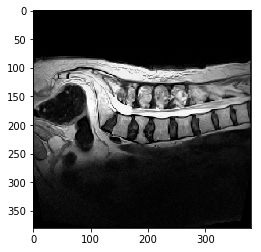

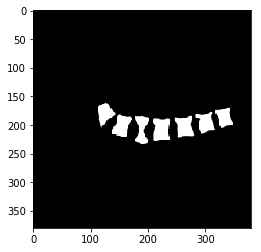

F03 480.55106 0.48479962 87.548035


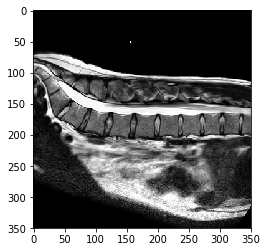

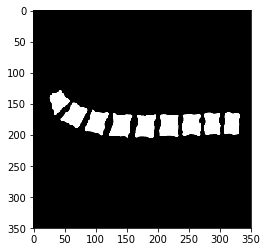

DzZ_T2 614.0503 0.730007 137.49086


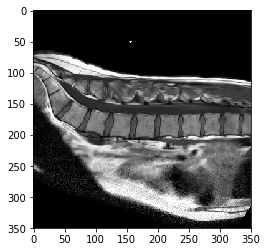

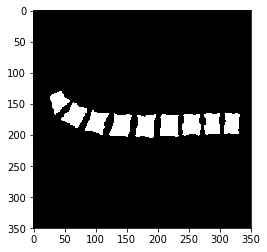

DzZ_T1 621.6264 0.9670734 151.97261


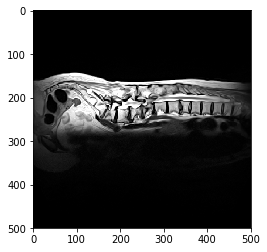

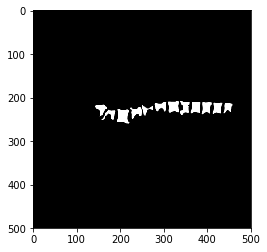

C002 471.4292 0.24154513 52.67154


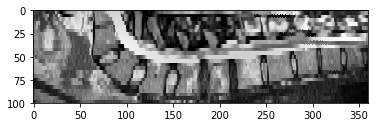

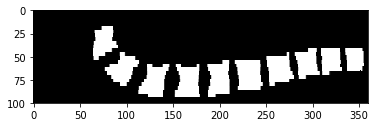

AKs3 1443.2808 60.11666 432.09808


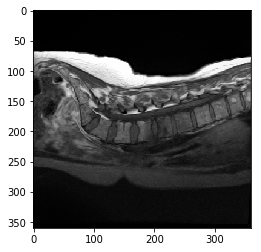

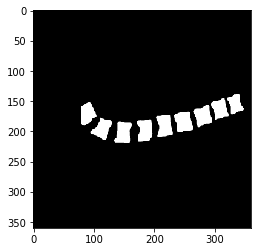

AKa3 1457.9253 2.281839 257.18625


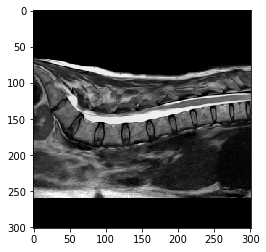

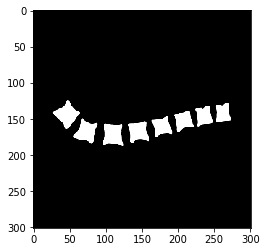

S02 449.71155 0.5967584 71.524284


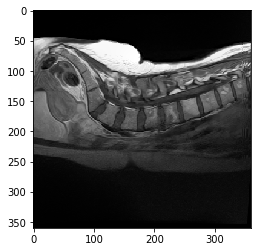

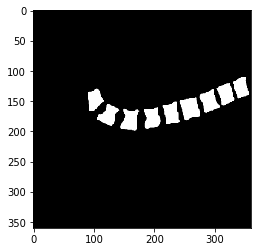

AKs8 1697.4896 4.105724 331.5744


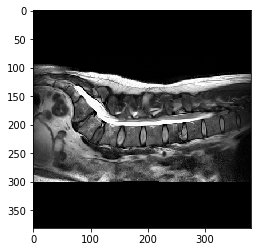

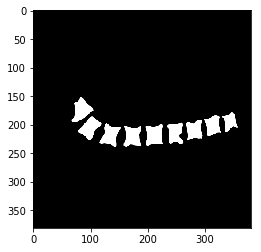

F02 367.99582 0.7844003 59.92412


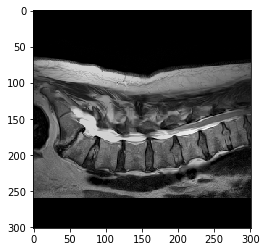

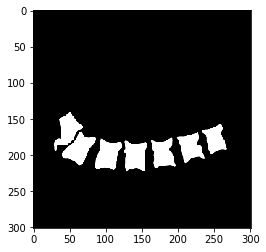

S01 414.31024 0.36667362 78.48349


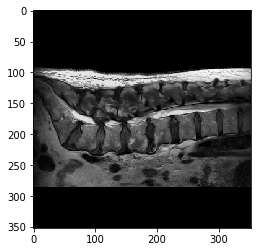

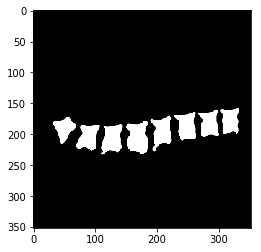

St1 397.53683 0.65564895 60.27217


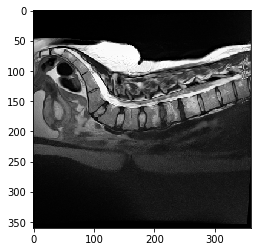

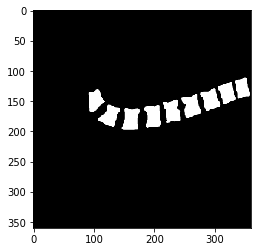

AKs5 1163.717 8.337507 232.84024


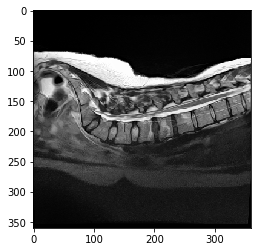

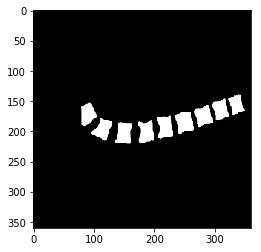

AKa2 984.4521 6.35615 193.97908


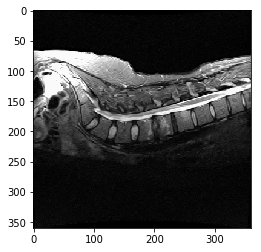

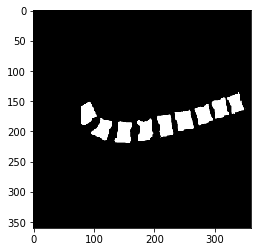

AKa4 323.12146 12.043604 62.803455


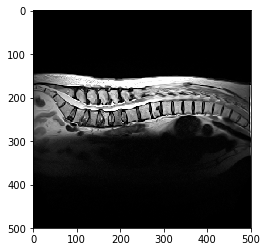

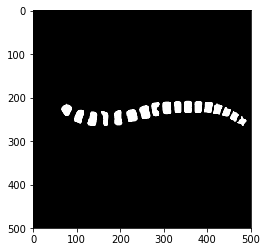

F04 449.58655 0.29776755 54.55026


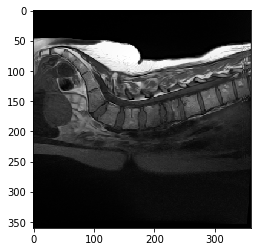

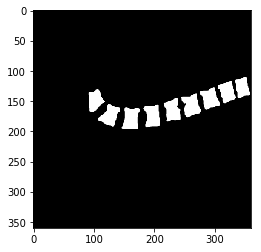

AKs6 1744.4197 4.3013444 298.7254


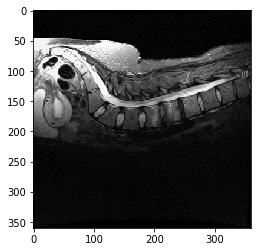

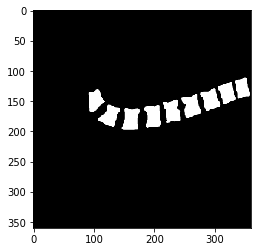

AKs7 360.50772 11.618636 64.33381


In [70]:
# use medpy to handle DICOM images
import os
from util import plot_img_histogram
import numpy as np
from medpy.io import load
from medpy.filter.image import resample
import ants


base_dir_scan = '../../datasets/siegen/scan'
base_dir_segment = '../../datasets/siegen/segment'

save_path = '../siegen_mri'

scan_names = [ p.replace('.dcm','') for p in os.listdir(base_dir_scan) if '.dcm' in p ]

# stats for denoised 
# 155.38142125746782 1674.8302 0.23095915

# with noise 
# 148.31079595229204 2765.0 0.0

for name in scan_names:
    scan_path = os.path.join(base_dir_scan, '{}.{}'.format(name, 'dcm'))
    name_segment = name.lower()
    segment_path = os.path.join(base_dir_segment, name, '{}_mask.mha'.format(name_segment))
    
    # special case for 'F03'
    scan = ants.image_read(scan_path)

    # resample
    scan = ants.resample_image(scan, (1,1,1))

    # reorient
    scan = scan.reorient_image2(orientation='LPI')

    # denoise and remove bias
    scan = ants.denoise_image(scan)
    scan = ants.abp_n4(scan, usen3=True)

    seg_scan = ants.image_read(segment_path)
    seg_scan = ants.resample_image(seg_scan, (1,1,1))
    seg_scan = seg_scan.reorient_image2(orientation='LPI')

    x, y, z = scan.numpy().shape

    scan = scan.numpy()
    seg_scan = seg_scan.numpy()

    show_image(scan[x//2,:,:])
    # show_image(scan[x//2,:,:])
    show_image(seg_scan[x//2,:,:])

    print(name, scan.max(), scan.min(), scan.mean())
    
    np.savez(os.path.join(save_path, name), image=scan, mask=seg_scan)
    

# print(global_mean/len(scan_names), global_max, global_min)

In [13]:
print(os.listdir('../../datasets/siegen/scan'))

['F03.dcm', 'DzZ_T2.dcm', 'DzZ_T1.dcm', 'C002.dcm', 'AKs3.dcm', 'AKa3.dcm', 'S02.dcm', 'AKs8.dcm', 'SpineDatasets.zip', 'F02.dcm', 'S01.dcm', 'St1.dcm', 'AKs5.dcm', 'AKa2.dcm', 'AKa4.dcm', 'F04.dcm', 'AKs6.dcm', 'AKs7.dcm']


In [2]:
import os
import numpy as np

scan = np.load('../siegen_mri/F03.npz')

## MRI Siegen stage 2

In [27]:
# from util import show_image


# paths = [ { 'name': name, 'path': os.path.join('../siegen_mri', name) } for name in os.listdir('../siegen_mri') ]

# train_paths = paths[:14]
# save_train_paths = '../siegen/train' 

# test_paths = paths[14:]
# save_test_paths = '../siegen/test'

# # mean, max and min
# # train stats 153.91553524562292 1744.4197 0.24154513
# global_min = 0.24154513
# global_max = 1744.4197
# global_mean = 153.91553524562292

# # test stats 157.72019958496094 1457.9253 0.36667362
# global_min = 0.36667362
# global_max = 1457.9253
# global_mean = 157.72019958496094

# for p in test_paths:
#     scan = np.load(p['path'])
#     image = scan['image']
#     mask = scan['mask']
#     name = p['name'].replace('.npz', '')
    
#     x = image.shape[0]
    
#     normalised_image = normalise(image, global_mean, global_max, global_min)
    
#     for i in range(x):
#         np.savez(os.path.join(save_test_paths, name + '.' + str(i)), image=normalised_image[i], mask=mask[i])
        
#     # print(image.mean(), image.min(), image.max())
    

In [4]:
from util import 
def whitening(X):
    # x, y = X.shape
        
    # compute the covariance of the image data
    cov = np.cov(X, rowvar=True)   # cov is (N, N)
    
    # singular value decomposition
    U,S,V = np.linalg.svd(cov)     # U is (N, N), S is (N,)
    
    # build the ZCA matrix
    epsilon = 1e-5
    zca_matrix = np.dot(U, np.dot(np.diag(1.0/np.sqrt(S + epsilon)), U.T))
    
    # transform the image data       zca_matrix is (N,N)
    zca = np.dot(zca_matrix, X)    # zca is (N, 3072)
    return zca

scan = np.load('../spine_scans_numpy/1.3.6.1.4.1.14519.5.2.1.6279.6001.138080888843357047811238713686.199.npz')
image = scan['image']

image = (image - image.mean()) / (image.max() - image.min()) * 255

whitened = whitening(image[120])
show_image(image[120])
show_image(whitened)


NameError: name 'show_image' is not defined

In [21]:
os.listdir('../spine_scans_numpy')

['1.3.6.1.4.1.14519.5.2.1.6279.6001.125356649712550043958727288500.199.npz',
 '1.3.6.1.4.1.14519.5.2.1.6279.6001.154837327827713479309898027966.199.npz',
 '1.3.6.1.4.1.14519.5.2.1.6279.6001.159996104466052855396410079250.199.npz',
 '1.3.6.1.4.1.14519.5.2.1.6279.6001.138813197521718693188313387015.199.npz',
 '1.3.6.1.4.1.14519.5.2.1.6279.6001.128881800399702510818644205032.199.npz',
 '1.3.6.1.4.1.14519.5.2.1.6279.6001.126121460017257137098781143514.199.npz',
 '1.3.6.1.4.1.14519.5.2.1.6279.6001.111496024928645603833332252962.199.npz',
 '1.3.6.1.4.1.14519.5.2.1.6279.6001.137375498893536422914241295628.199.npz',
 '1.3.6.1.4.1.14519.5.2.1.6279.6001.110678335949765929063942738609.199.npz',
 '1.3.6.1.4.1.14519.5.2.1.6279.6001.135657246677982059395844827629.199.npz',
 '1.3.6.1.4.1.14519.5.2.1.6279.6001.160124400349792614505500125883.199.npz',
 '1.3.6.1.4.1.14519.5.2.1.6279.6001.159665703190517688573100822213.199.npz',
 '1.3.6.1.4.1.14519.5.2.1.6279.6001.139889514693390832525232698200.199.npz',